In [1]:
import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/pvc-6/pvc6_helper_modules/')



from pvc6_stim_analysis import *
from pvc6_load_data import *
from pvc6_plotting import *


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from spikeparam.patch.fit import Spike, SpikeGroup
from tqdm.notebook import tqdm
import pickle

import seaborn as sns
sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})

import warnings
warnings.filterwarnings('ignore')

#### Data source: PVC-6 (CRCNS) — Cell 2

Same dataset and analysis pipeline as cell 1 (see `spk_waveform_stim_predictors_cell1`), applied to a second recording (151145.04_Data.h5). Replicating across cells tests whether the stimulus-driven waveform variability we observe is a general property of cortical neurons rather than an idiosyncrasy of one recording.

#### Loading the raw electrophysiology data

Same loading pipeline as cell 1. We inspect a constant-current sweep (sweep 54) and a pink-noise sweep (sweep 65) to confirm signal quality before batch processing.

In [2]:
fs = 200000 # sampling rate
one_ms = int(fs / 1000)
total_sweeps = 66
filename =  '/Users/blancamartin/Downloads/151145.04_Data.h5' # filename
f = h5py.File(filename, 'r')

##### Constant current — baseline waveform

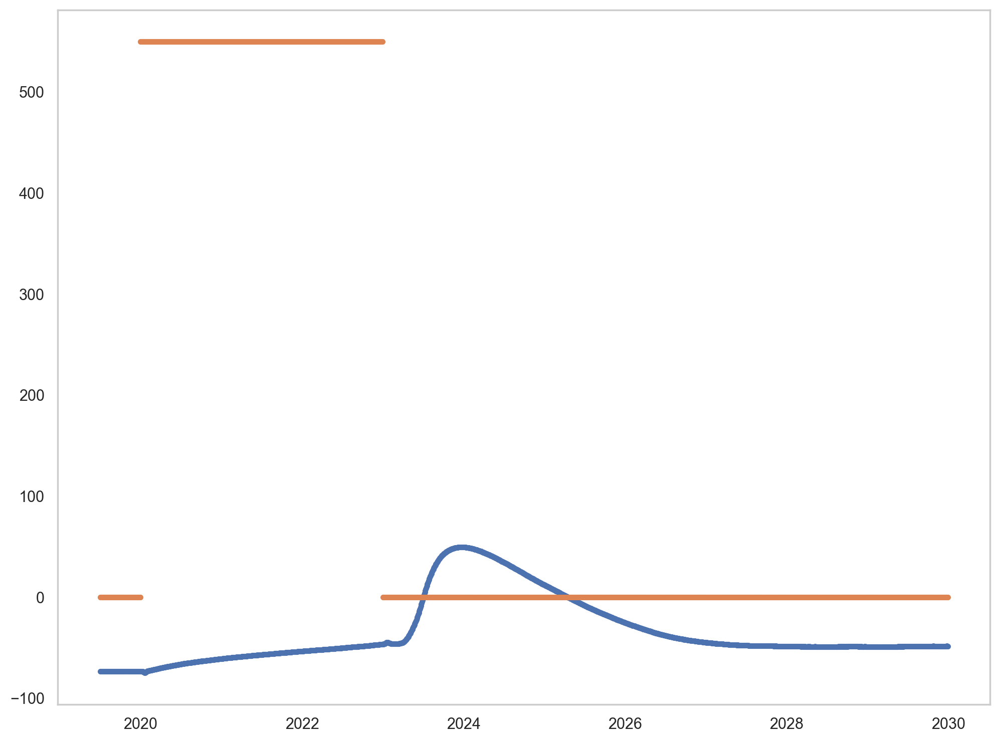

In [3]:
sweep_number = 54
index_start = 403900
index_end = 406000
dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

##### Pink noise — stimulus-driven variability

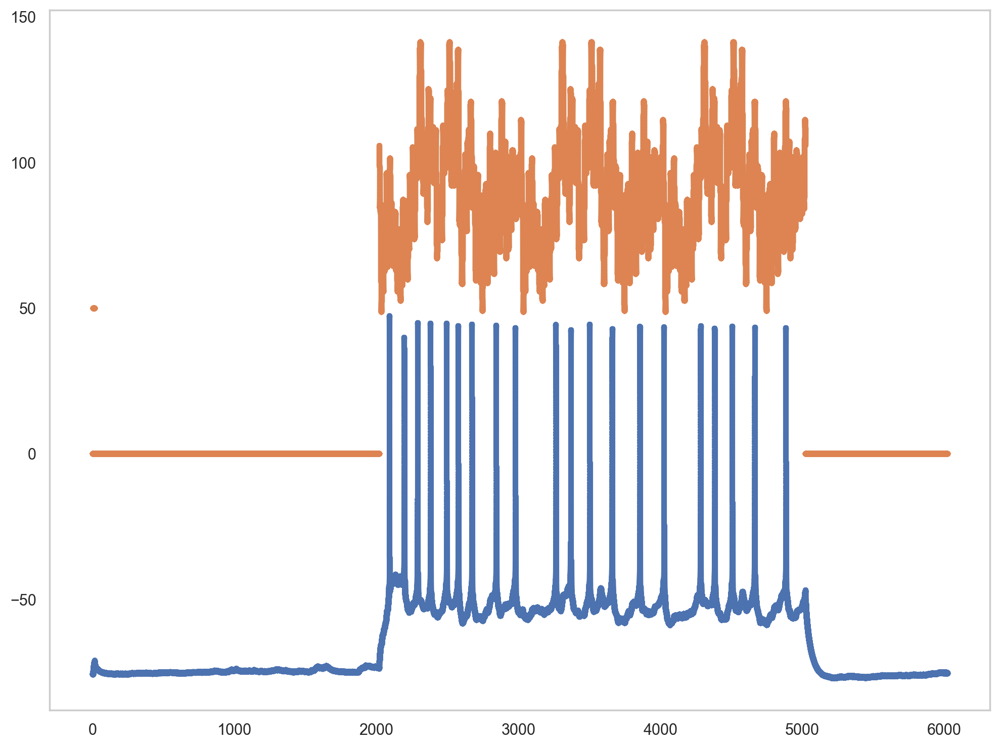

In [4]:
sweep_number = 65
index_start = 0
index_end = int(10e10)
dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

#### Cataloguing stimulus types and pink noise variants

Same as cell 1 — we label each sweep's stimulus type and extract pink noise spectral properties per spike.

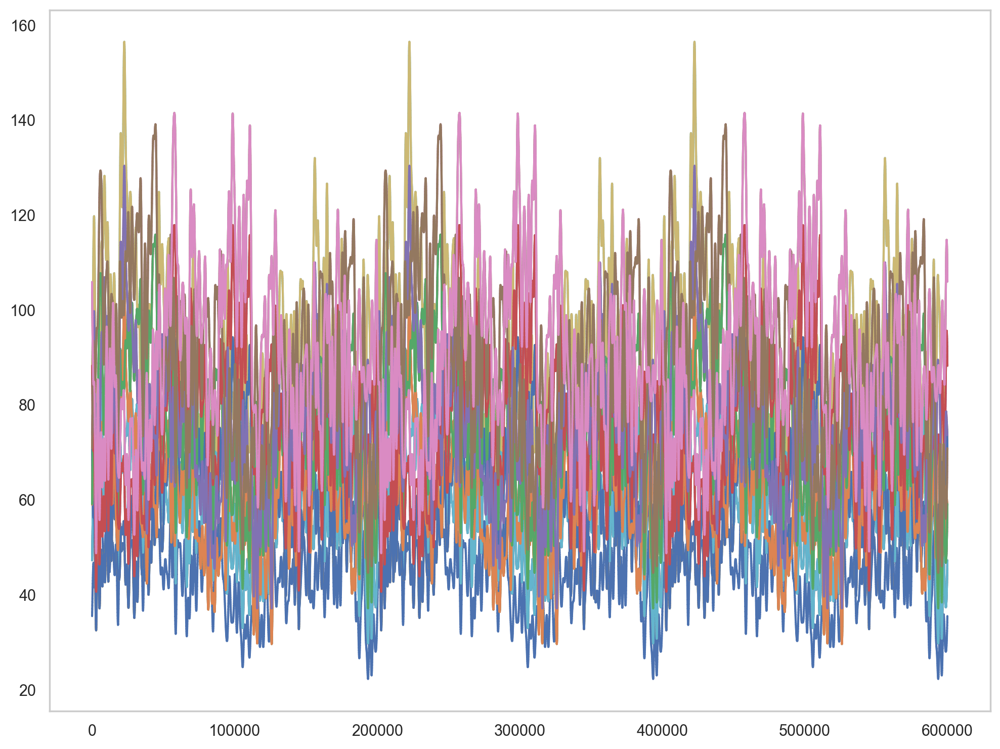

In [5]:
# Process sweeps and extract features
pink_types = process_pink_type_info(f, fs)

#### Processing sweeps and parameterizing spike waveforms

Same pipeline as cell 1. Note: three sweeps (27, 47, 50) are removed in the next step due to incorrect spike counts in the raw data.

In [6]:
# Process sweeps and extract features

"""

df_sweep, df_stim_type, df_spike_number, df_voltage_ramp, df_inflection_time, df_inflection_mv, \
df_peak_amplitude, df_peak_sharpness, df_decay_lambda, df_decay_const, df_stim_exp, df_stim_mean, \
df_stim_std, df_pinktype, all_data, all_times, all_contant_spks, all_ramp_spks, all_pink_spks = process_sweeps(66, f, one_ms, fs, pink_types, load_sweep, find_spike_times, fit_exp_nonlinear)

stim_waveforms = [all_contant_spks, all_ramp_spks, all_pink_spks]

df_stim_features = pd.DataFrame({'sweep': df_sweep, 'stim_type': df_stim_type, 'spike_num': df_spike_number,
                     'stim_exp': df_stim_exp, 'stim_mean': df_stim_mean,
                    'stim_std': df_stim_std,'pink_type':df_pinktype },
        columns=['sweep', 'stim_type', 'spike_num', 'stim_exp', 'stim_mean', 'stim_std', 'pink_type'])
all_data_flat =  [n for one_dim in all_data for n in one_dim]

"""



"\n\ndf_sweep, df_stim_type, df_spike_number, df_voltage_ramp, df_inflection_time, df_inflection_mv, df_peak_amplitude, df_peak_sharpness, df_decay_lambda, df_decay_const, df_stim_exp, df_stim_mean, df_stim_std, df_pinktype, all_data, all_times, all_contant_spks, all_ramp_spks, all_pink_spks = process_sweeps(66, f, one_ms, fs, pink_types, load_sweep, find_spike_times, fit_exp_nonlinear)\n\nstim_waveforms = [all_contant_spks, all_ramp_spks, all_pink_spks]\n\ndf_stim_features = pd.DataFrame({'sweep': df_sweep, 'stim_type': df_stim_type, 'spike_num': df_spike_number,\n                     'stim_exp': df_stim_exp, 'stim_mean': df_stim_mean,\n                    'stim_std': df_stim_std,'pink_type':df_pinktype },\n        columns=['sweep', 'stim_type', 'spike_num', 'stim_exp', 'stim_mean', 'stim_std', 'pink_type'])\nall_data_flat =  [n for one_dim in all_data for n in one_dim]\n\n"

In [7]:
"""
# Save processed sweeps as pickles
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/df_stim_features2.pkl', 'wb') as file:
    pickle.dump(df_stim_features, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/all_data2.pkl', 'wb') as file:
    pickle.dump(all_data, file)
    
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/stim_waveforms2.pkl', 'wb') as file:
    pickle.dump(stim_waveforms, file)    

"""


"\n# Save processed sweeps as pickles\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/df_stim_features2.pkl', 'wb') as file:\n    pickle.dump(df_stim_features, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/all_data2.pkl', 'wb') as file:\n    pickle.dump(all_data, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/stim_waveforms2.pkl', 'wb') as file:\n    pickle.dump(stim_waveforms, file)    \n\n"

In [8]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/df_stim_features2.pkl', 'rb') as file:
    df_stim_features = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/all_data2.pkl', 'rb') as file:
    all_data = pickle.load(file)


with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/stim_waveforms2.pkl', 'rb') as file:
    stim_waveforms = pickle.load(file)

In [9]:
all_contant_spks, all_ramp_spks, all_pink_spks = stim_waveforms[0], stim_waveforms[1], stim_waveforms[2]

In [10]:
#try collapsing the all data array to 1d (concatenate all sweeps)
all_data_flat =  [n for one_dim in all_data for n in one_dim]

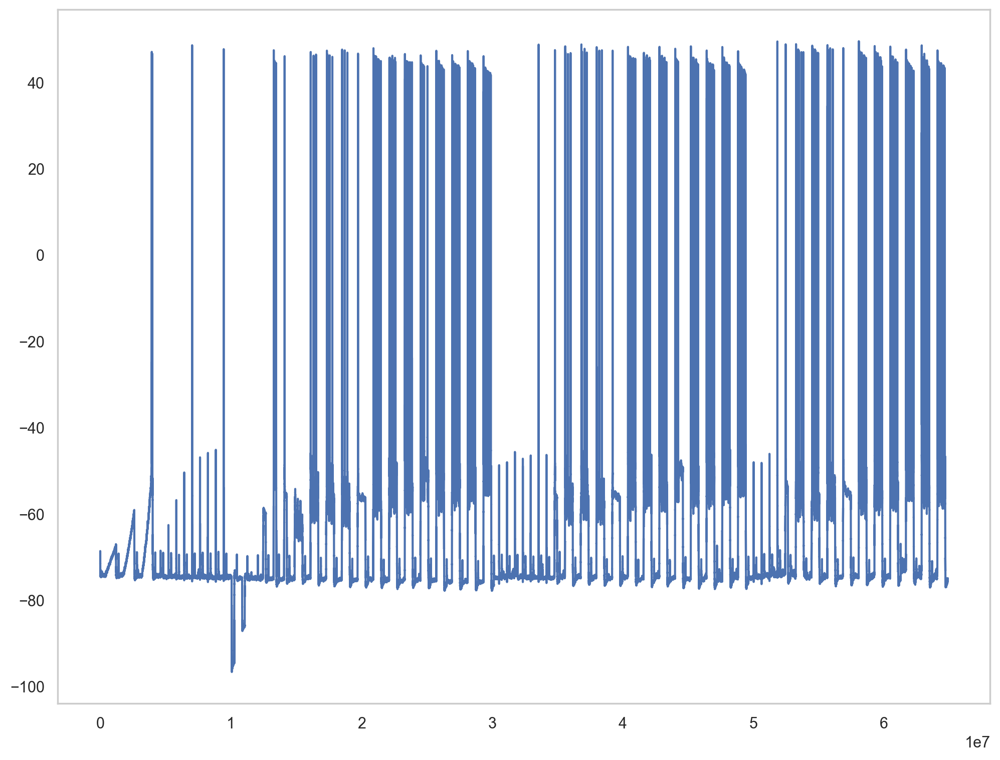

In [11]:
plt.plot(all_data_flat)

#### Visualizing a single spike waveform and its first derivative

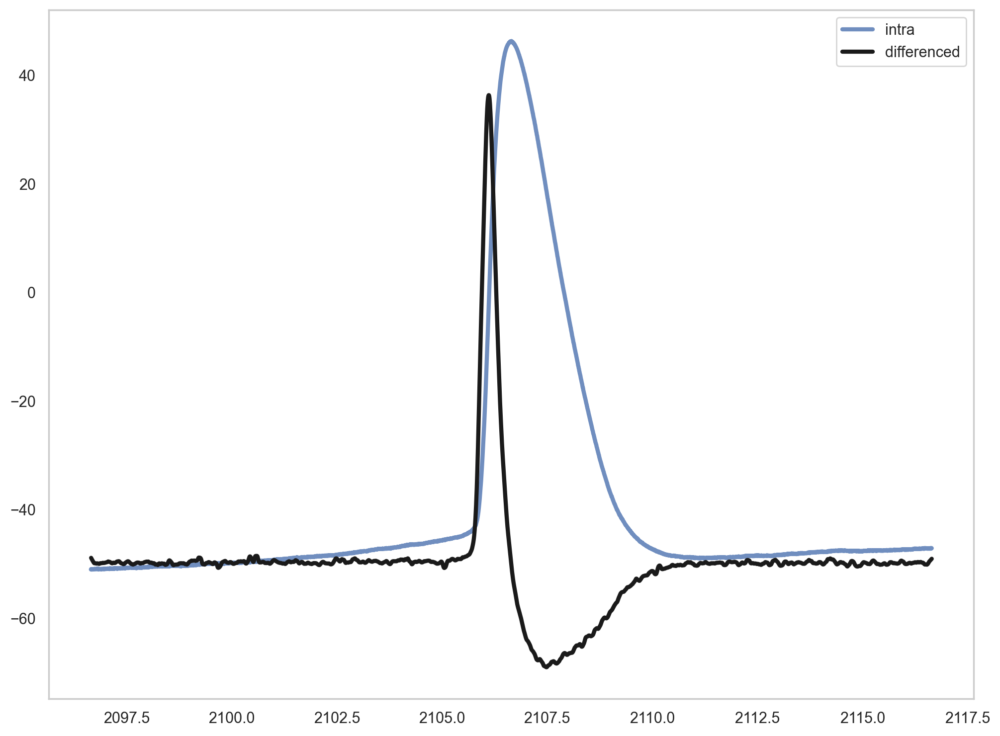

In [12]:
plot_spike_and_derivative(28, f, fs, one_ms)

#### Data cleaning: removing sweeps with incorrect spike counts

Sweeps 27, 47, and 50 have incorrect spike counts in the raw data (likely due to detection errors near sweep boundaries). We drop these rows before fitting to avoid corrupting the feature distribution.

In [13]:
# Assuming your DataFrame is called df and the column for sweeps is 'sweep'

# Identify rows that belong to the sweeps where one row needs to be removed
sweeps_to_fix = [50, 47, 27]

# Create a mask that finds the first occurrence of each sweep in sweeps_to_fix
mask = df_stim_features[df_stim_features['sweep'].isin(sweeps_to_fix)].groupby('sweep').head(1).index

# Drop the first occurrence for each incorrect sweep
df_stim_features = df_stim_features.drop(mask)

# Reset index after removal (optional)
df_stim_features = df_stim_features.reset_index(drop=True)



#### Fitting spike waveforms with the Spike class

Same feature extraction as cell 1: peak amplitude, sharpness, width, exp_lambda, exp_const, inflection time, log ISI.

In [14]:
sp = Spike(thresh_amp= -10, window_length=(5., 5.), smooth_frac=.008, pre_inflection_ms = 0.5)
sp.fit(all_data_flat, fs, n_jobs=-1, progress=tqdm)

Spike:   0%|          | 0/380 [00:00<?, ?it/s]

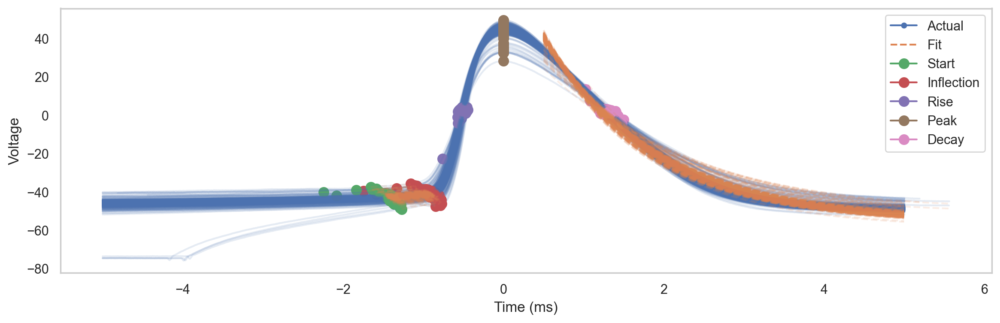

In [15]:
sp.plot(show_points=True)

In [16]:
sp.filter_features()

In [17]:
df_features = sp.df_features

#### Merging spike features with stimulus metadata

In [18]:
df = pd.concat([df_stim_features, df_features], axis=1)
df = df.dropna(subset=['stim_type'])

In [19]:
df

,sweep,stim_type,spike_num,stim_exp,stim_mean,stim_std,pink_type,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
0,2.0,ramp,0.0,NaN,NaN,NaN,ramp,3.595110,0.910,-40.687501,47.062501,1.770,0.781250,0.751443,-57.186790,2.376047
1,2.0,ramp,1.0,NaN,NaN,NaN,ramp,3.635989,0.915,-40.000001,46.625001,1.800,0.781250,0.723876,-57.425108,4.182372
2,7.0,constant,0.0,NaN,NaN,NaN,constant,4.593834,0.805,-45.531251,48.593751,1.735,1.062500,0.776968,-58.690058,4.082506
3,11.0,constant,0.0,NaN,NaN,NaN,constant,-5.110936,0.845,-47.468751,47.687501,1.785,0.937500,0.772022,-58.185266,4.282112
4,16.0,constant,0.0,NaN,NaN,NaN,constant,4.664379,0.840,-42.843751,47.437501,1.755,0.937500,0.788614,-55.249580,1.721893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,65.0,pink,15.0,0.659722,99.514875,3.355962,PinkNoise9,4.454958,0.910,-39.468751,43.000001,1.810,0.812500,0.706074,-53.849272,2.291435
373,65.0,pink,16.0,1.298633,119.563250,2.833350,PinkNoise9,4.021527,0.910,-40.593751,43.750001,1.790,0.812500,0.721460,-54.680384,2.227385
374,65.0,pink,17.0,1.386186,122.388375,2.546485,PinkNoise9,4.446970,0.930,-40.687501,43.531251,1.820,0.750000,0.711005,-54.489821,2.412536
375,65.0,pink,18.0,0.551817,110.324750,7.318235,PinkNoise9,4.415467,0.910,-40.406251,43.937501,1.815,0.875000,0.714389,-54.339506,1.997714


#### Average waveform by stimulus type

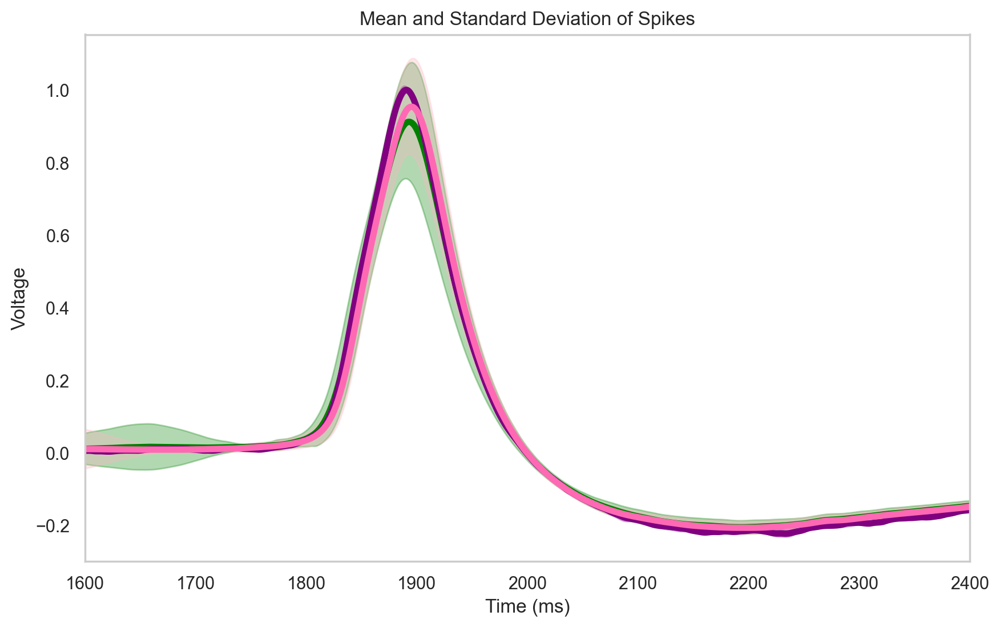

In [20]:
plot_avg_waveform_by_stim_type(all_contant_spks, all_ramp_spks,all_pink_spks)

#### Pink noise spikes — waveform gallery

In [21]:
pink_spikes = df[df['stim_type'] == 'pink']

# Get the indices to plot
indices_to_plot = pink_spikes.index.tolist()

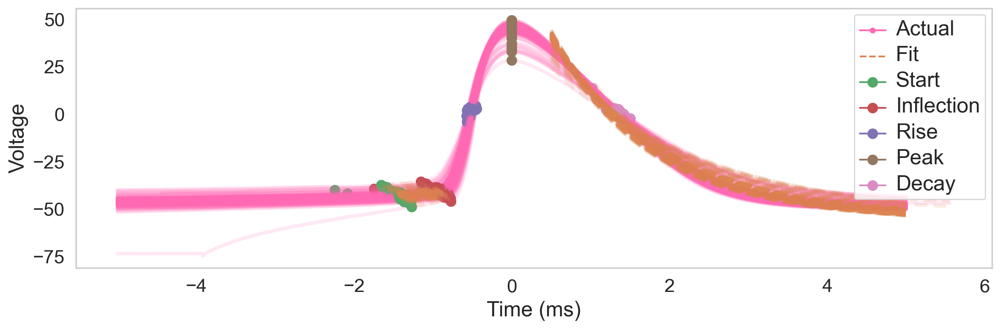

In [22]:
plot_pink_spikes(sp, indices_to_plot)

##### Excluding last-spike-of-sweep artifacts

In [23]:
last_spikes_indices = df.groupby('sweep').tail(1).index
print("Indices of last spikes in each sweep:", last_spikes_indices)

Indices of last spikes in each sweep: Index([  1,   2,   3,  13,  14,  17,  21,  24,  25,  37,  47,  58,  65,  85,
       103, 119, 136, 137, 138, 142, 146, 149, 150, 162, 172, 183, 189, 209,
       228, 245, 264, 265, 266, 272, 278, 283, 284, 298, 311, 322, 334, 356,
       376],
      dtype='int64')


#### Feature correlation structure — does stimulus drive shape waveform co-variation?

Same three-pass analysis as cell 1: all spikes → all pink spikes → first pink spike per sweep.

##### All spikes (constant + ramp + pink combined)

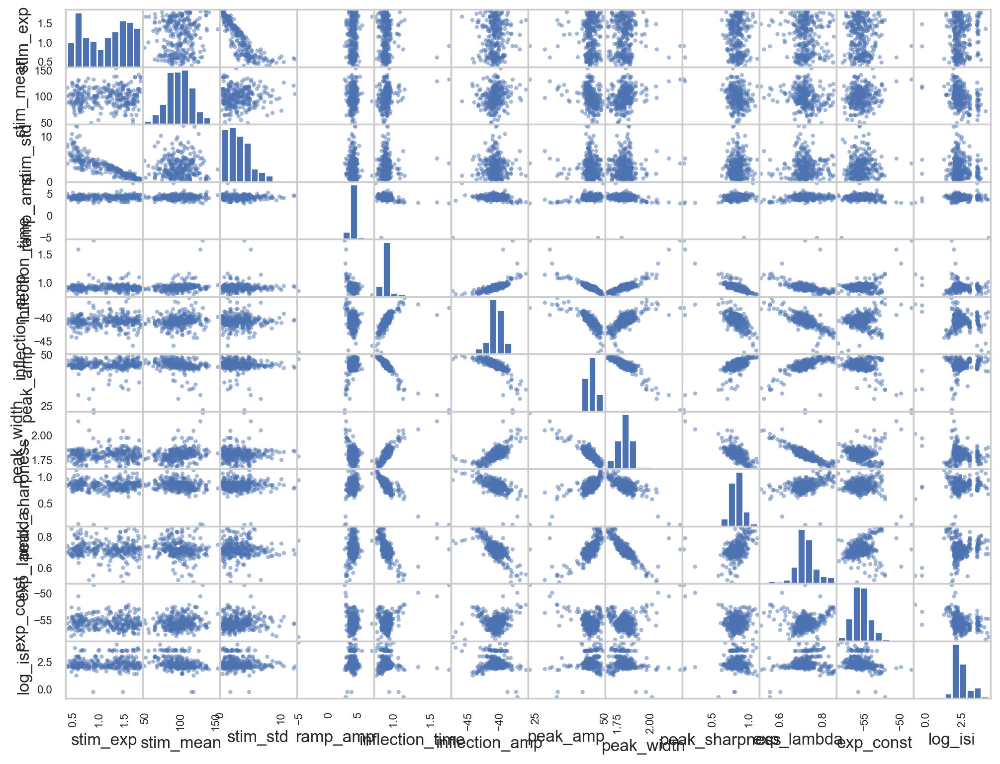

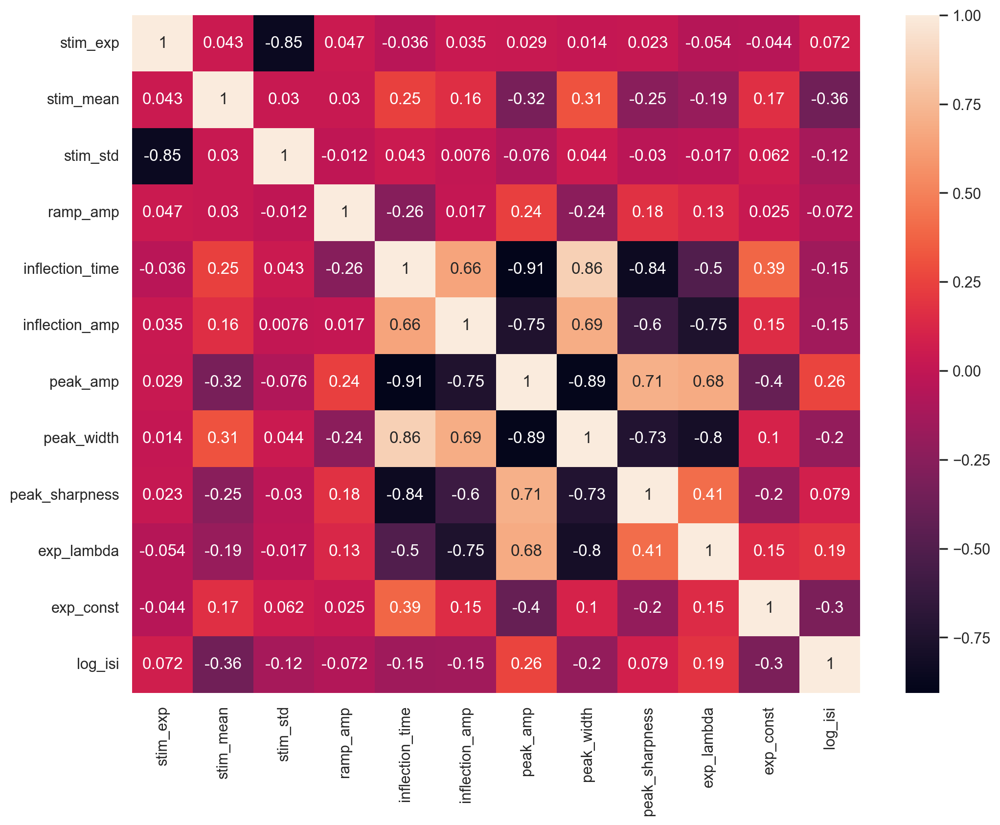

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,0.04,-0.85***,0.05,-0.04,0.04,0.03,0.01,0.02,-0.05,-0.04,0.07
stim_mean,0.04,1.0***,0.03,0.03,0.25***,0.16**,-0.32***,0.31***,-0.25***,-0.19**,0.17**,-0.36***
stim_std,-0.85***,0.03,1.0***,-0.01,0.04,0.01,-0.08,0.04,-0.03,-0.02,0.06,-0.12*
ramp_amp,0.05,0.03,-0.01,1.0***,-0.26***,0.02,0.24***,-0.24***,0.18***,0.13*,0.02,-0.07
inflection_time,-0.04,0.25***,0.04,-0.26***,1.0***,0.66***,-0.91***,0.86***,-0.84***,-0.5***,0.39***,-0.15**
inflection_amp,0.04,0.16**,0.01,0.02,0.66***,1.0***,-0.75***,0.69***,-0.6***,-0.75***,0.15**,-0.15**
peak_amp,0.03,-0.32***,-0.08,0.24***,-0.91***,-0.75***,1.0***,-0.89***,0.71***,0.68***,-0.4***,0.26***
peak_width,0.01,0.31***,0.04,-0.24***,0.86***,0.69***,-0.89***,1.0***,-0.73***,-0.8***,0.1,-0.2***
peak_sharpness,0.02,-0.25***,-0.03,0.18***,-0.84***,-0.6***,0.71***,-0.73***,1.0***,0.41***,-0.2***,0.08
exp_lambda,-0.05,-0.19**,-0.02,0.13*,-0.5***,-0.75***,0.68***,-0.8***,0.41***,1.0***,0.15**,0.19***


In [24]:
df_all = df.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)
pd.plotting.scatter_matrix(df_all, alpha=0.5)
plt.show()
spikes_corr = df_all.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho = df_all.corr()
pval = df_all.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

##### Pink noise spikes only

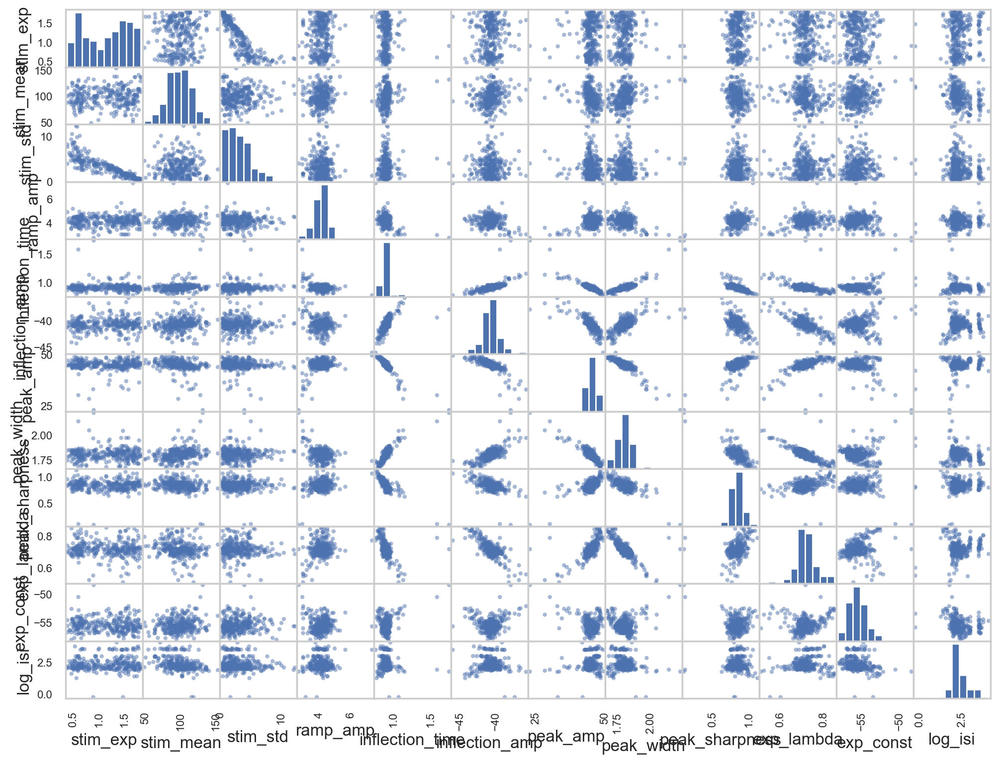

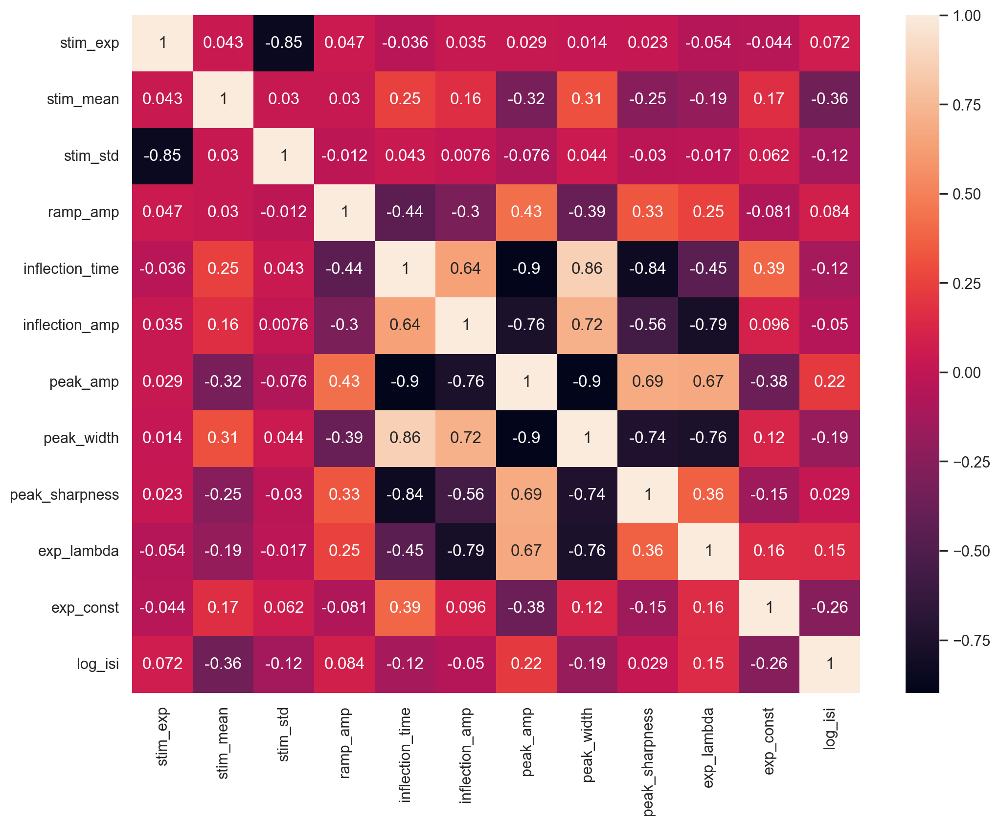

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,0.04,-0.85***,0.05,-0.04,0.04,0.03,0.01,0.02,-0.05,-0.04,0.07
stim_mean,0.04,1.0***,0.03,0.03,0.25***,0.16**,-0.32***,0.31***,-0.25***,-0.19**,0.17**,-0.36***
stim_std,-0.85***,0.03,1.0***,-0.01,0.04,0.01,-0.08,0.04,-0.03,-0.02,0.06,-0.12*
ramp_amp,0.05,0.03,-0.01,1.0***,-0.44***,-0.3***,0.43***,-0.39***,0.33***,0.25***,-0.08,0.08
inflection_time,-0.04,0.25***,0.04,-0.44***,1.0***,0.64***,-0.9***,0.86***,-0.84***,-0.45***,0.39***,-0.12*
inflection_amp,0.04,0.16**,0.01,-0.3***,0.64***,1.0***,-0.76***,0.72***,-0.56***,-0.79***,0.1,-0.05
peak_amp,0.03,-0.32***,-0.08,0.43***,-0.9***,-0.76***,1.0***,-0.9***,0.69***,0.67***,-0.38***,0.22***
peak_width,0.01,0.31***,0.04,-0.39***,0.86***,0.72***,-0.9***,1.0***,-0.74***,-0.76***,0.12*,-0.19**
peak_sharpness,0.02,-0.25***,-0.03,0.33***,-0.84***,-0.56***,0.69***,-0.74***,1.0***,0.36***,-0.15**,0.03
exp_lambda,-0.05,-0.19**,-0.02,0.25***,-0.45***,-0.79***,0.67***,-0.76***,0.36***,1.0***,0.16**,0.15**


In [25]:
df_pink = df.loc[df['stim_type'] == 'pink']
df_pink = df_pink.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)
pd.plotting.scatter_matrix(df_pink, alpha=0.5)
plt.show()
spikes_corr = df_pink.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho = df_pink.corr()
pval = df_pink.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

##### First spike of each pink sweep — minimizing adaptation

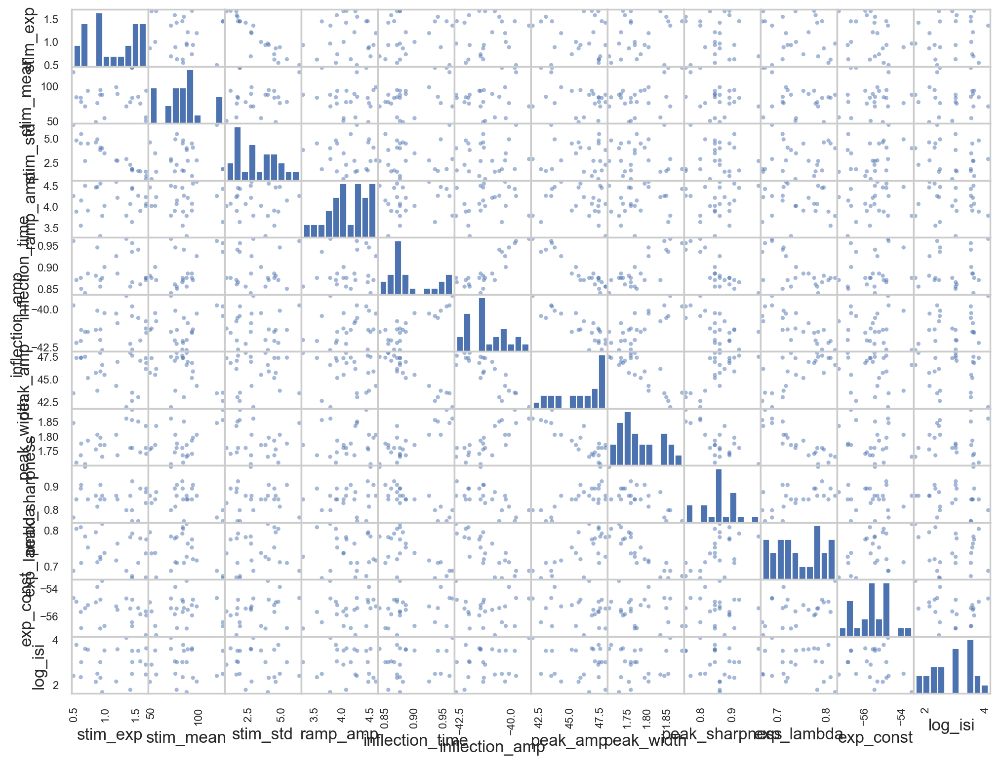

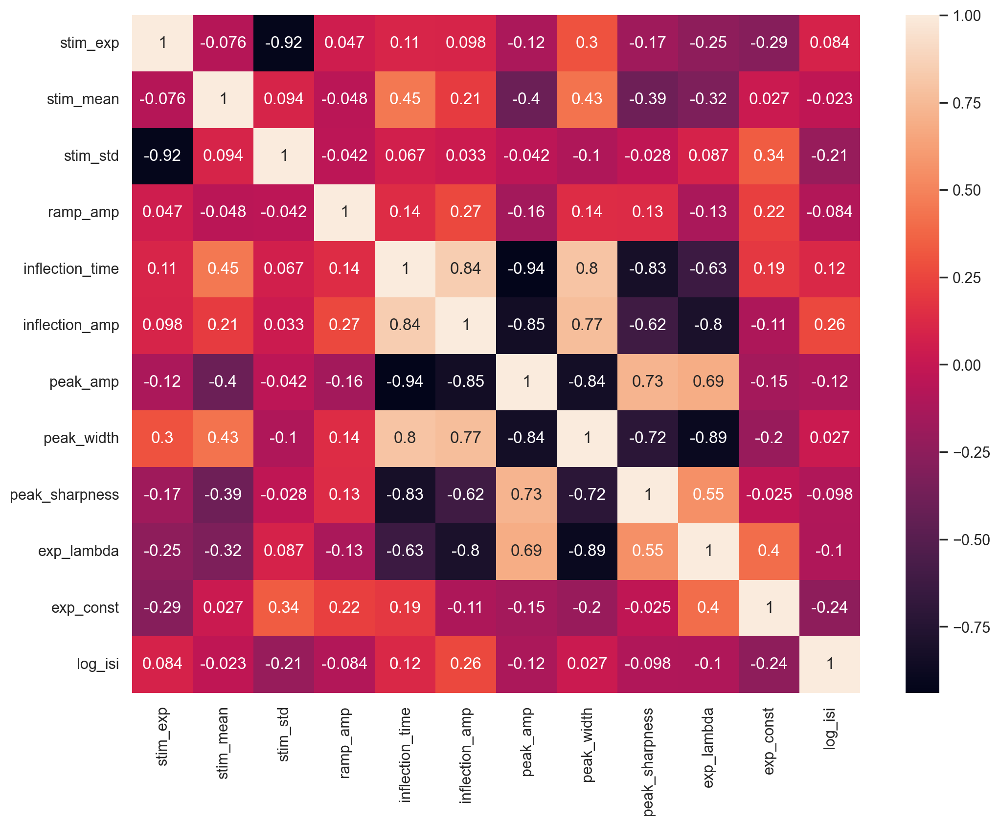

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,-0.08,-0.92***,0.05,0.11,0.1,-0.12,0.3,-0.17,-0.25,-0.29,0.08
stim_mean,-0.08,1.0***,0.09,-0.05,0.45*,0.21,-0.4,0.43*,-0.39,-0.32,0.03,-0.02
stim_std,-0.92***,0.09,1.0***,-0.04,0.07,0.03,-0.04,-0.1,-0.03,0.09,0.34,-0.21
ramp_amp,0.05,-0.05,-0.04,1.0***,0.14,0.27,-0.16,0.14,0.13,-0.13,0.22,-0.08
inflection_time,0.11,0.45*,0.07,0.14,1.0***,0.84***,-0.94***,0.8***,-0.83***,-0.63***,0.19,0.12
inflection_amp,0.1,0.21,0.03,0.27,0.84***,1.0***,-0.85***,0.77***,-0.62**,-0.8***,-0.11,0.26
peak_amp,-0.12,-0.4,-0.04,-0.16,-0.94***,-0.85***,1.0***,-0.84***,0.73***,0.69***,-0.15,-0.12
peak_width,0.3,0.43*,-0.1,0.14,0.8***,0.77***,-0.84***,1.0***,-0.72***,-0.89***,-0.2,0.03
peak_sharpness,-0.17,-0.39,-0.03,0.13,-0.83***,-0.62**,0.73***,-0.72***,1.0***,0.55**,-0.02,-0.1
exp_lambda,-0.25,-0.32,0.09,-0.13,-0.63***,-0.8***,0.69***,-0.89***,0.55**,1.0***,0.4,-0.1


In [26]:
df_pink_first = df.loc[df['stim_type'] == 'pink']
df_pink_first = df_pink_first.loc[df['spike_num'] == 0]
df_pink_first = df_pink_first.drop(['sweep', 'stim_type', 'spike_num', 'pink_type',], axis=1)
pd.plotting.scatter_matrix(df_pink_first, alpha=0.5)
plt.show()
spikes_corr = df_pink_first.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho =df_pink_first.corr()
pval = df_pink_first.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.map(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

##### Correlation scatter plots — pink spikes (excluding last-sweep spikes)

In [27]:
# Find which indices are actually present in df_pink, remove last spike of sweeps
valid_indices = [idx for idx in last_spikes_indices if idx in df_pink.index]

# Drop the last spikes
df_pink_filtered = df_pink.drop(valid_indices)

In [28]:
#get dfs for regression models 

df_pink_no_stim_filtered = df_pink_filtered.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_no_stim_first = df_pink_first.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_onlystim_filtered = df_pink_filtered.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)
df_pink_onlystim_first = df_pink_first.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)


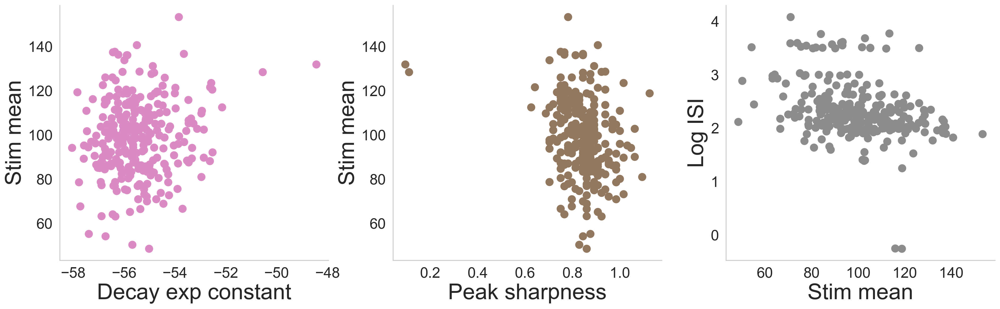

In [29]:
plot_correlation_scatter(df_pink_filtered)

#### Can spike waveform features decode stimulus type?

Same three-classifier comparison as cell 1 (logistic regression, SVM, random forest). A consistent above-chance accuracy across both cells would strongly support stimulus-driven waveform modulation as a robust phenomenon.

In [30]:
df

,sweep,stim_type,spike_num,stim_exp,stim_mean,stim_std,pink_type,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
0,2.0,ramp,0.0,NaN,NaN,NaN,ramp,3.595110,0.910,-40.687501,47.062501,1.770,0.781250,0.751443,-57.186790,2.376047
1,2.0,ramp,1.0,NaN,NaN,NaN,ramp,3.635989,0.915,-40.000001,46.625001,1.800,0.781250,0.723876,-57.425108,4.182372
2,7.0,constant,0.0,NaN,NaN,NaN,constant,4.593834,0.805,-45.531251,48.593751,1.735,1.062500,0.776968,-58.690058,4.082506
3,11.0,constant,0.0,NaN,NaN,NaN,constant,-5.110936,0.845,-47.468751,47.687501,1.785,0.937500,0.772022,-58.185266,4.282112
4,16.0,constant,0.0,NaN,NaN,NaN,constant,4.664379,0.840,-42.843751,47.437501,1.755,0.937500,0.788614,-55.249580,1.721893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,65.0,pink,15.0,0.659722,99.514875,3.355962,PinkNoise9,4.454958,0.910,-39.468751,43.000001,1.810,0.812500,0.706074,-53.849272,2.291435
373,65.0,pink,16.0,1.298633,119.563250,2.833350,PinkNoise9,4.021527,0.910,-40.593751,43.750001,1.790,0.812500,0.721460,-54.680384,2.227385
374,65.0,pink,17.0,1.386186,122.388375,2.546485,PinkNoise9,4.446970,0.930,-40.687501,43.531251,1.820,0.750000,0.711005,-54.489821,2.412536
375,65.0,pink,18.0,0.551817,110.324750,7.318235,PinkNoise9,4.415467,0.910,-40.406251,43.937501,1.815,0.875000,0.714389,-54.339506,1.997714


##### Sanity check of firing rate and sweep length

In [31]:
# Calculate the number of spikes in each sweep
spike_counts = df.groupby('sweep')['spike_num'].count()

# Calculate the duration of each sweep in seconds using the indices from spike_counts
sweep_durations = {sweep: len(all_data[int(sweep)]) / fs for sweep in spike_counts.index}

# Calculate the firing rate for each sweep
firing_rates = {sweep: spike_counts[sweep] / sweep_durations[sweep] for sweep in spike_counts.index}

# Convert the dictionary to a DataFrame for easier handling and visualization
firing_rate_df = pd.DataFrame(list(firing_rates.items()), columns=['Sweep', 'Firing Rate'])

# Extract 'stim_type' values for each unique 'sweep'
stim_type_series = df.groupby('sweep')['stim_type'].first()
# Add the 'stim_type' to the firing_rate_df
firing_rate_df['Stim Type'] = firing_rate_df['Sweep'].map(stim_type_series)

# Display the updated DataFrame
print(firing_rate_df)

    Sweep  Firing Rate Stim Type
0     2.0     0.284900      ramp
1     7.0     0.330797  constant
2    11.0     0.330797  constant
3    16.0     2.487559  constant
4    17.0     0.248756  constant
5    19.0     0.498338      pink
6    20.0     0.664451      pink
7    21.0     0.498338      pink
8    22.0     0.166113  constant
9    23.0     1.993354      pink
10   24.0     1.661128      pink
11   25.0     1.827241      pink
12   26.0     1.162790  constant
13   27.0     3.322256      pink
14   28.0     2.990031      pink
15   29.0     2.657805      pink
16   30.0     2.823918  constant
17   36.0     0.330797  constant
18   38.0     0.248756  constant
19   39.0     0.664451      pink
20   40.0     0.664451      pink
21   41.0     0.498338      pink
22   42.0     0.166113  constant
23   43.0     1.993354      pink
24   44.0     1.661128      pink
25   45.0     1.827241      pink
26   46.0     0.996677  constant
27   47.0     3.322256      pink
28   48.0     3.156144      pink
29   49.0 

In [32]:
df = df.dropna(subset=['stim_type'])

X = df.drop(columns=['stim_type', 'spike_num', 'sweep', 'stim_exp','stim_mean','stim_std', 'pink_type', 'log_isi'], inplace=False)
y = df['stim_type']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##### (A) Logistic Regression

In [33]:
#logr_model, logr_accs = logistic_regression_stim(X, y, X_train, X_test, y_train, y_test)

In [34]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model2.pkl', 'wb') as file:
    pickle.dump(logr_model, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs2.pkl', 'wb') as file:
    pickle.dump(logr_accs, file)

"""

"\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model2.pkl', 'wb') as file:\n    pickle.dump(logr_model, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs2.pkl', 'wb') as file:\n    pickle.dump(logr_accs, file)\n\n"

In [35]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model2.pkl', 'rb') as file:
    logr_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs2.pkl', 'rb') as file:
    logr_accs = pickle.load(file)

In [36]:
logr_acc = logr_model.score(X_test, y_test)


##### (B) SVM

In [37]:
#svm_model, svm_accs = svm_stim(X, y, X_train, X_test, y_train, y_test)

In [38]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model2.pkl', 'wb') as file:
    pickle.dump(svm_model, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs2.pkl', 'wb') as file:
    pickle.dump(svm_accs, file)
"""


"\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model2.pkl', 'wb') as file:\n    pickle.dump(svm_model, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs2.pkl', 'wb') as file:\n    pickle.dump(svm_accs, file)\n"

In [39]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model2.pkl', 'rb') as file:
    svm_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs2.pkl', 'rb') as file:
    svm_accs = pickle.load(file)

In [40]:
svm_acc = svm_model.score(X_test, y_test)

##### (C) Random Forest — ensemble decoder + feature importance

In [ ]:
_mask = pd.notna(y_train) & pd.notna(y_test)
y_train_clean = y_train[pd.notna(y_train)]
X_train_clean = X_train.loc[y_train_clean.index]
y_test_clean = y_test[pd.notna(y_test)]
X_test_clean = X_test.loc[y_test_clean.index]

rf_model, rf_accs = random_forest_stim(X_train_clean, y_train_clean, X_train_clean, X_test_clean, y_train_clean, y_test_clean)

In [ ]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_model2.pkl', 'wb') as file:
    pickle.dump(rf_model, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_accs2.pkl', 'wb') as file:
    pickle.dump(rf_accs, file)
"""

In [ ]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_model2.pkl', 'rb') as file:
    rf_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_accs2.pkl', 'rb') as file:
    rf_accs = pickle.load(file)

In [ ]:
# Calculate average accuracy
rf_avg_accs = np.mean(rf_accs)

rf_stdev_accs = np.std(rf_accs)

#### Comparing all three classifiers

In [ ]:
print(f"Accuracy Logistic Regression: {logr_acc: .3f}")
print(f"Accuracy SVM: {svm_acc: .3f}")
print(f"Mean Accuracy Random Forest: {rf_avg_accs: .3f}")
print(f"Stdev Accuracy Random Forest: {rf_stdev_accs: .3f}")

Accuracy Logistic Regression:  0.803
Accuracy SVM:  0.803
Mean Accuracy Random Forest:  0.814
Stdev Accuracy Random Forest:  0.022


#### Note: Bootrstrapped results for this classification are weird because this cell has a lot of class inbalance (mostly pink, few constant, only one ramp sweep) - In general the stim prediction doesn't make much sense for this cell because of that 

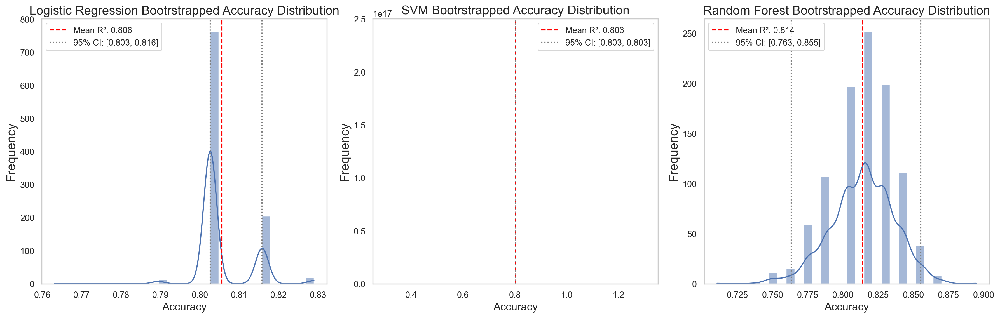

In [ ]:
plot_bootstrap_histograms([logr_accs, svm_accs, rf_accs], ["Logistic Regression", "SVM", "Random Forest"])

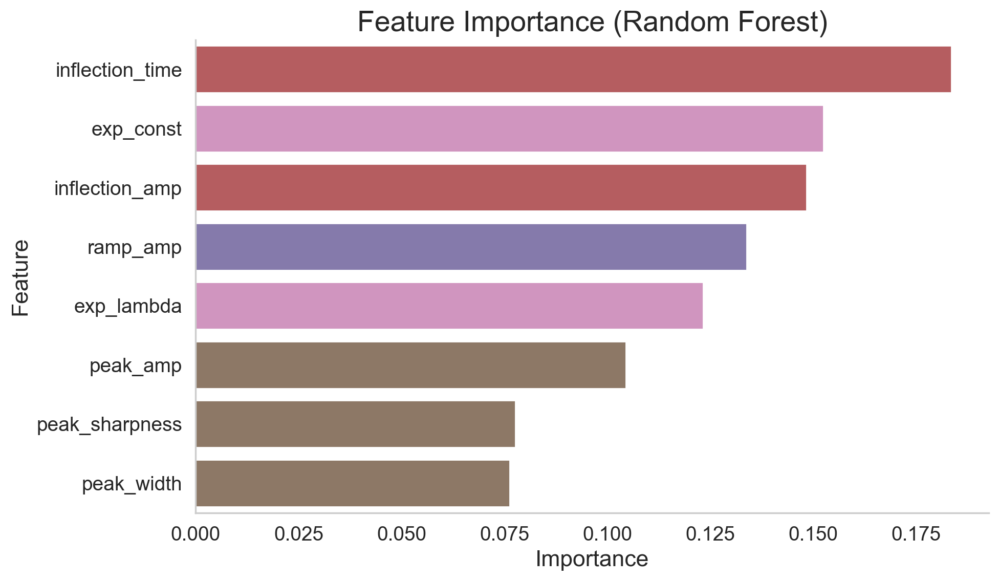

In [ ]:
plot_feature_importance_categorical(rf_model,X)

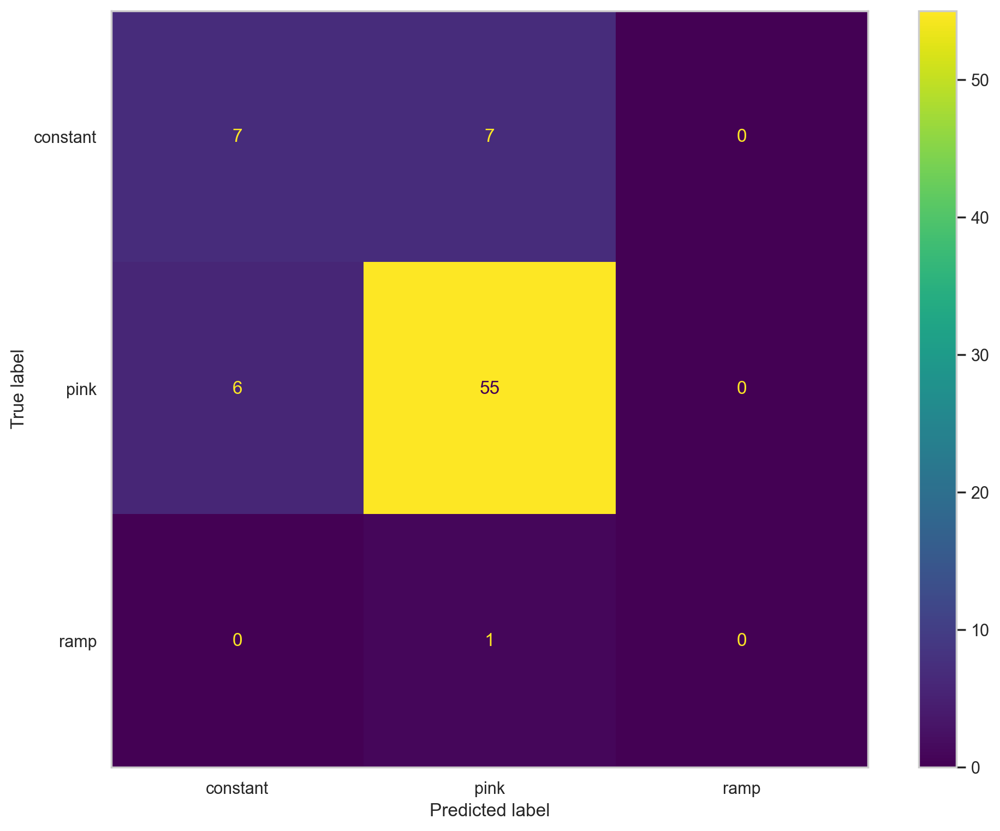

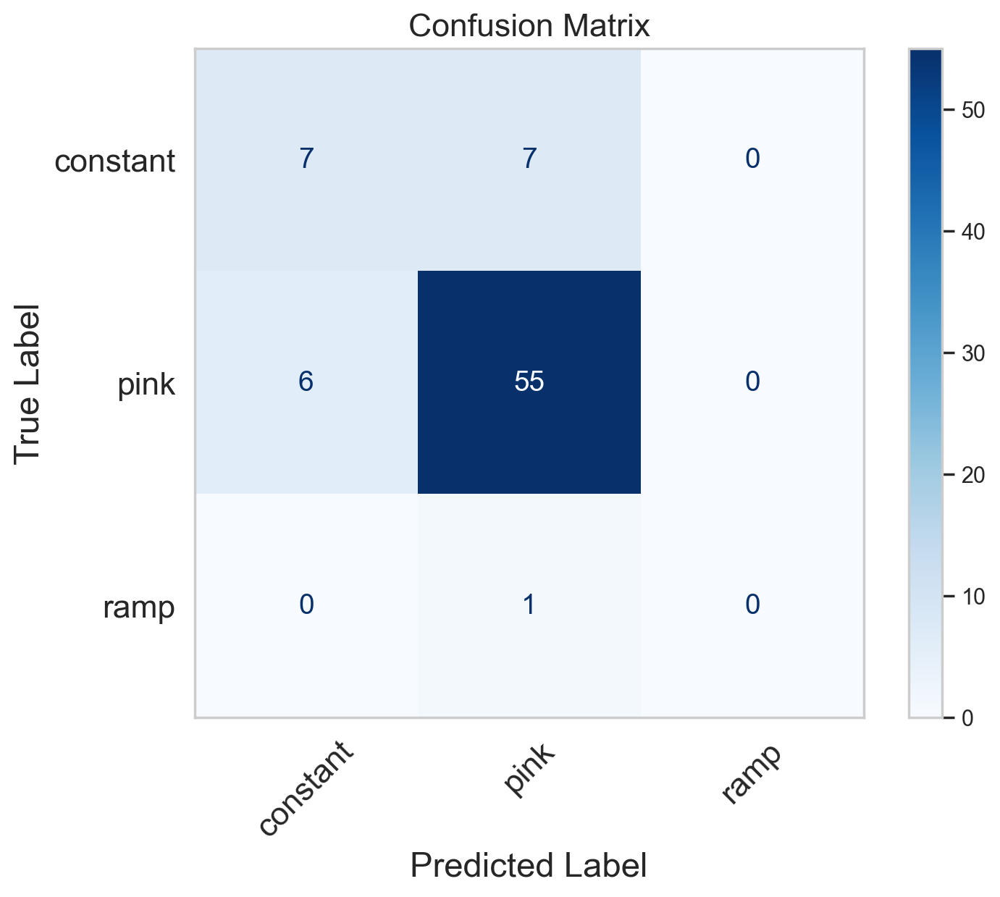

In [ ]:
plot_confusion_matrix(rf_model, X_test, y_test)

#### Predicting pink noise stimulus statistics from spike waveform features

In [ ]:
# Store results for each stimulus feature
ridge_results_dict = {}

for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    print(f"\n--- Processing {stim_feature} ---\n")

    # Filter data for the current stimulus feature
    data = df_pink_filtered.dropna(subset=[stim_feature])
    
    # Define features (X) and target variable (y)
    X = data.drop(columns=['stim_exp', 'stim_mean', 'stim_std'])
    y = data[stim_feature]

    # Run Ridge Regression with K-Fold and Bootstrapping
    ridge_results = run_ridge_regression_kfold(X, y)
    ridge_results_dict[stim_feature] = ridge_results
    
    # Print R² statistics
    print(f"Mean R² for {stim_feature}: {ridge_results['r2_mean']:.3f}")
    print(f"95% CI for R²: {ridge_results['r2_ci']}")



--- Processing stim_exp ---

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions

#### Plot results


--- Plotting stim_exp ---



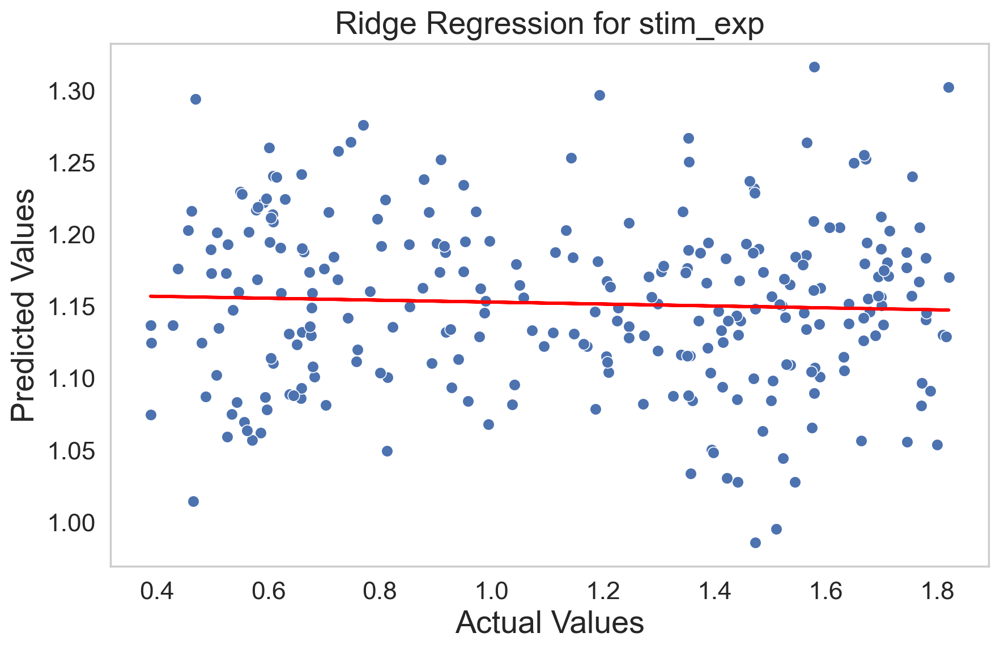

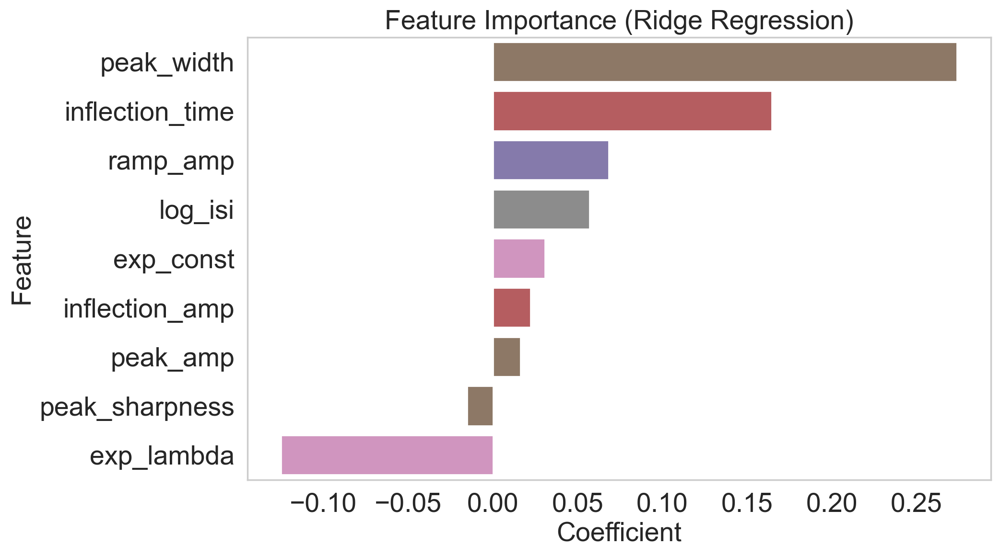


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
4       peak_width     0.273797  0.016315  0.493767   0.000000e+00
1  inflection_time     0.164450 -0.016504  0.318452  1.592097e-312
0         ramp_amp     0.068397 -0.072955  0.208284  9.969839e-145
8          log_isi     0.057117 -0.097065  0.205202   7.988362e-93
7        exp_const     0.030638 -0.019015  0.079790  4.517076e-195
2   inflection_amp     0.022035 -0.065139  0.104119   4.010189e-71
3         peak_amp     0.016219 -0.024177  0.063489  4.756171e-115
6       exp_lambda    -0.125009 -0.369396  0.098947  4.205458e-159


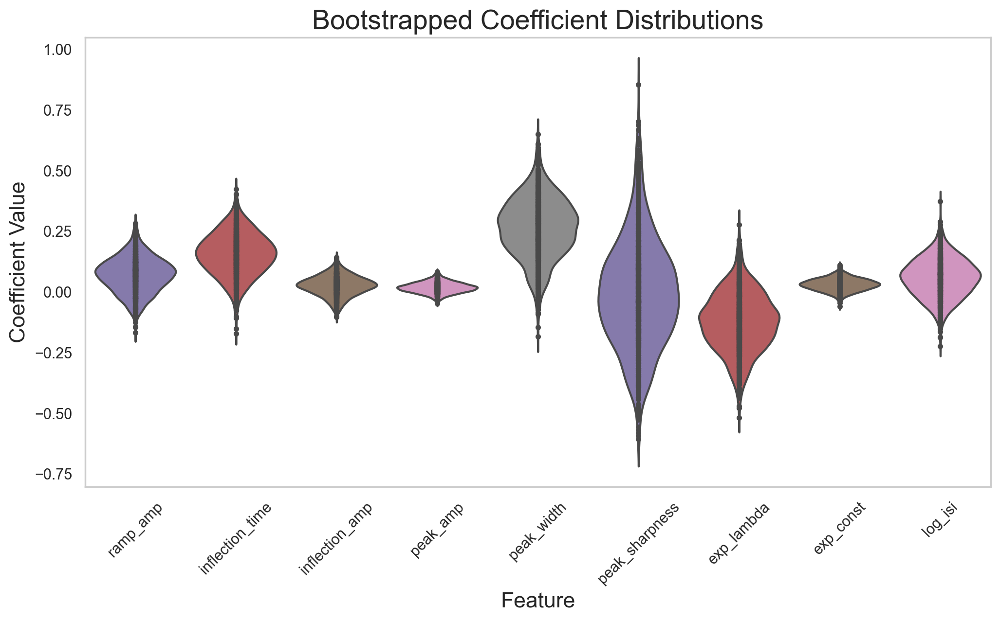

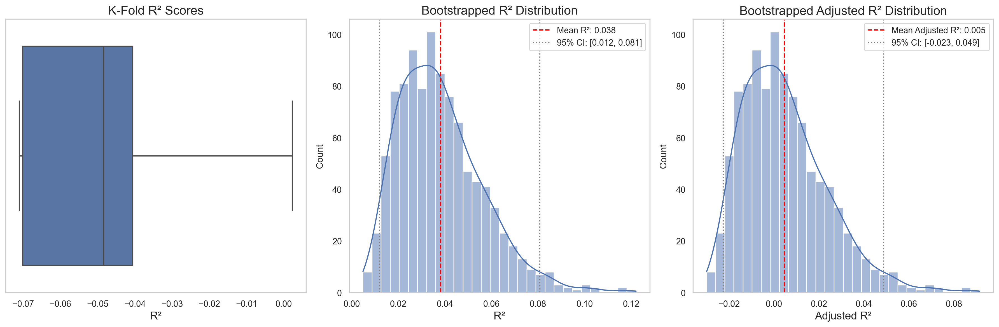


Mean Adjusted R-squared (Bootstrapped): 0.005
95% CI for Adjusted R-squared: [-0.02262187  0.04867993]

--- Plotting stim_mean ---



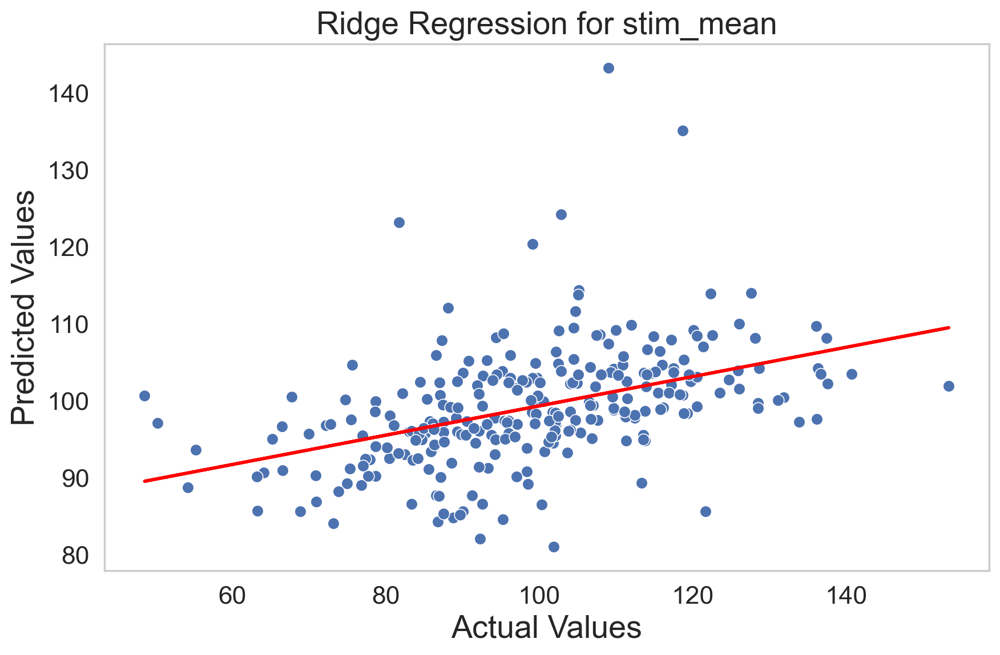

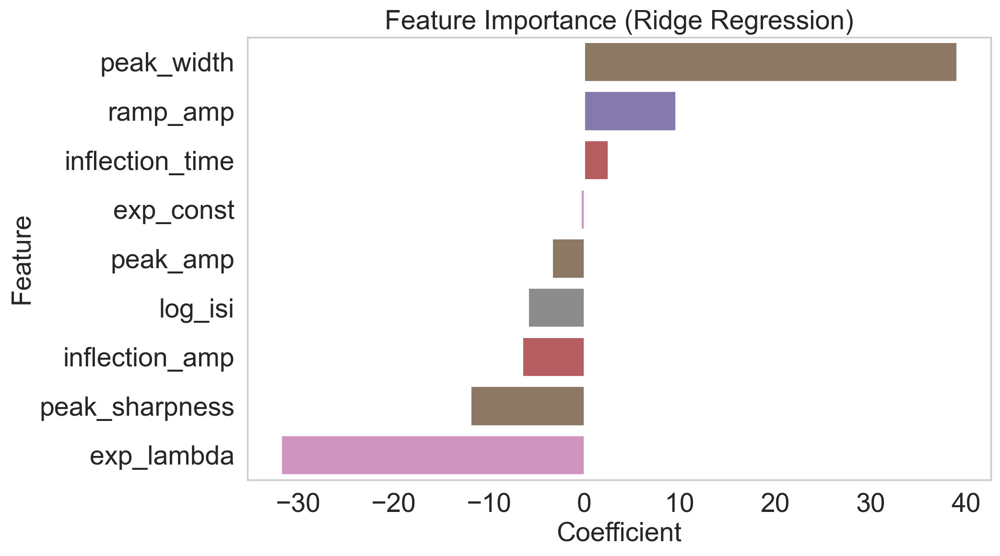


Significant Features (p < 0.05):
           Feature  Coefficient   CI Lower   CI Upper        p-value
4       peak_width    39.051126  27.973210  47.475770   0.000000e+00
0         ramp_amp     9.600361   4.720122  14.749845   0.000000e+00
1  inflection_time     2.522709  -4.521993   9.095881   1.345922e-74
7        exp_const    -0.388363  -2.335599   1.555300   1.727715e-29
3         peak_amp    -3.402116  -6.350442  -1.787444   0.000000e+00
8          log_isi    -5.888228 -11.195038   0.538388   0.000000e+00
2   inflection_amp    -6.503558 -10.280922  -3.434224   0.000000e+00
5   peak_sharpness   -11.927318 -26.291624   3.339023  3.429421e-266
6       exp_lambda   -31.792533 -40.406185 -21.486804   0.000000e+00


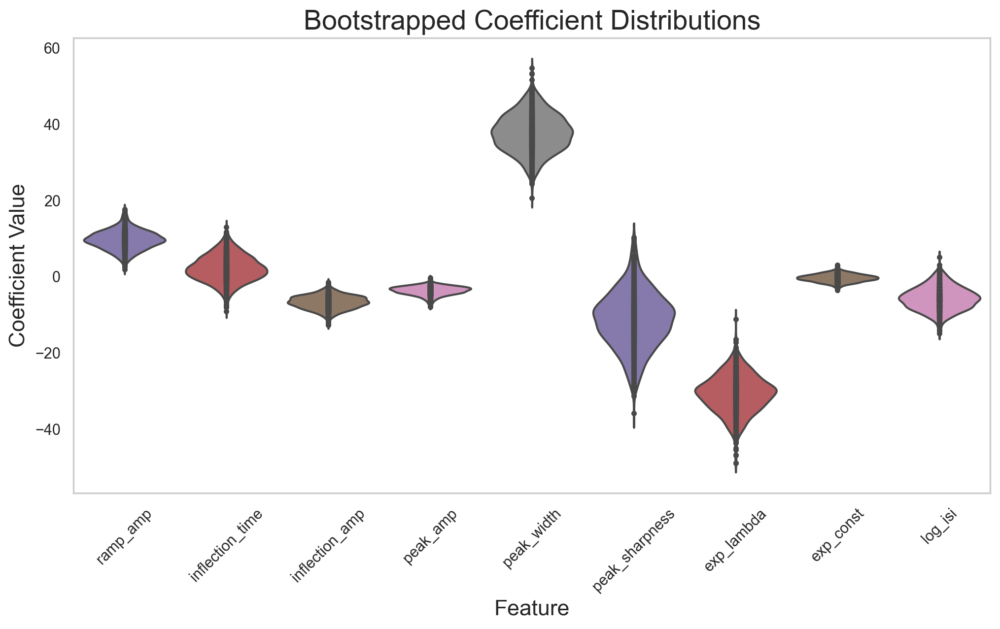

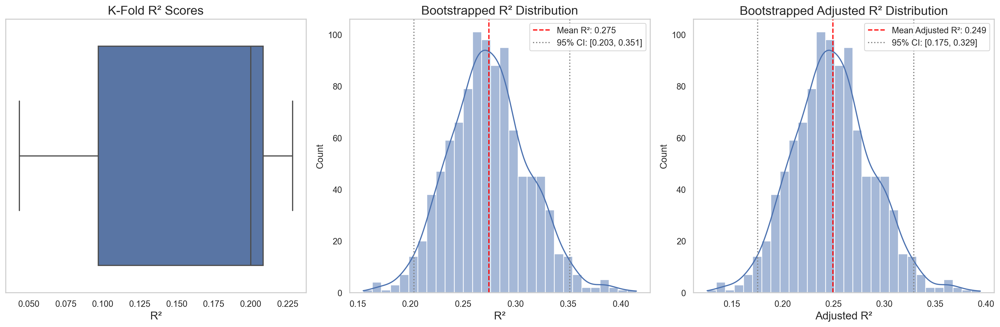


Mean Adjusted R-squared (Bootstrapped): 0.249
95% CI for Adjusted R-squared: [0.17532436 0.32874371]

--- Plotting stim_std ---



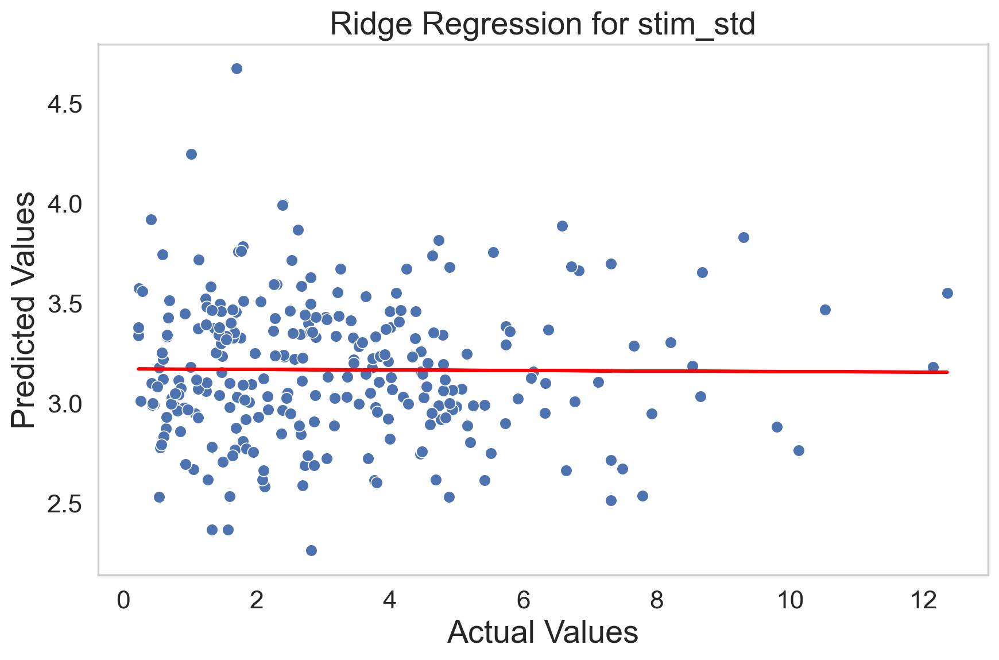

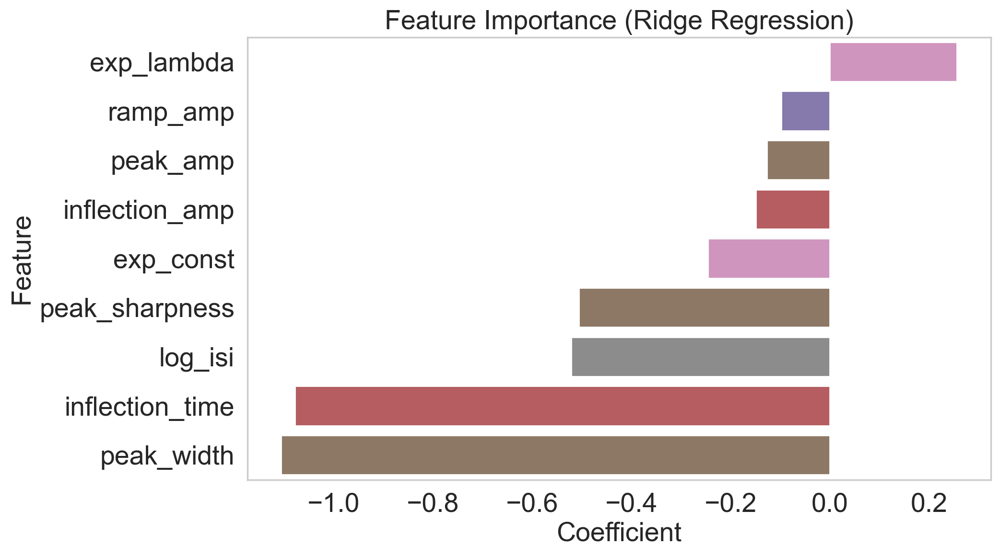


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
6       exp_lambda     0.255579 -0.839516  1.466741   6.855594e-52
0         ramp_amp    -0.098322 -0.769570  0.590491   1.532933e-14
3         peak_amp    -0.127046 -0.450330  0.077060  1.324670e-171
2   inflection_amp    -0.149213 -0.632894  0.281356   2.163637e-86
7        exp_const    -0.245876 -0.551010  0.048585  6.748361e-287
5   peak_sharpness    -0.505967 -2.373149  1.326918   1.239815e-40
8          log_isi    -0.521183 -1.233955  0.238877  1.258227e-231
1  inflection_time    -1.077632 -1.983423 -0.172996   0.000000e+00
4       peak_width    -1.105501 -2.395789  0.193630  2.545016e-302


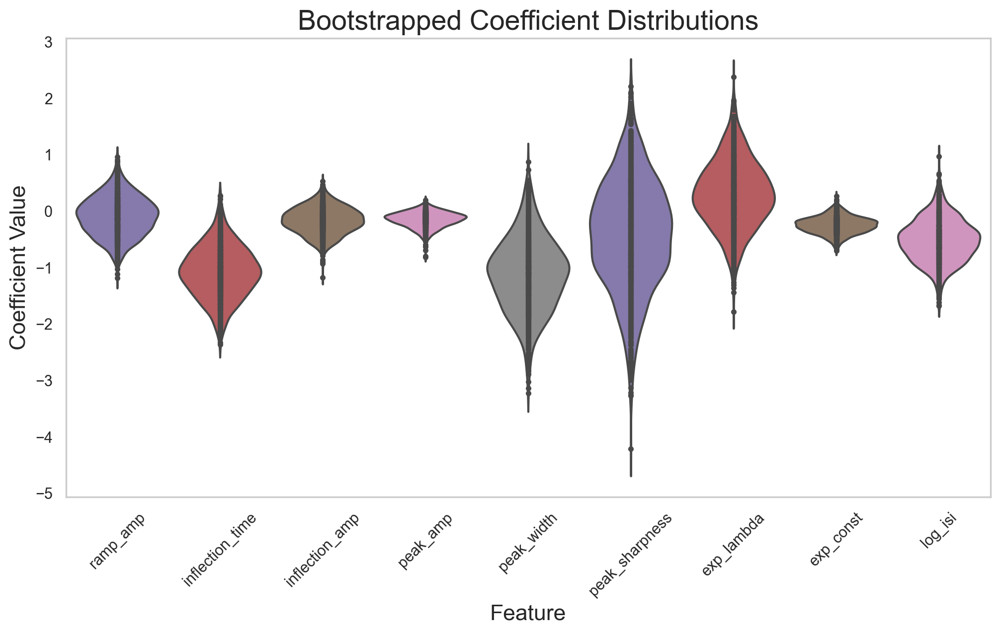

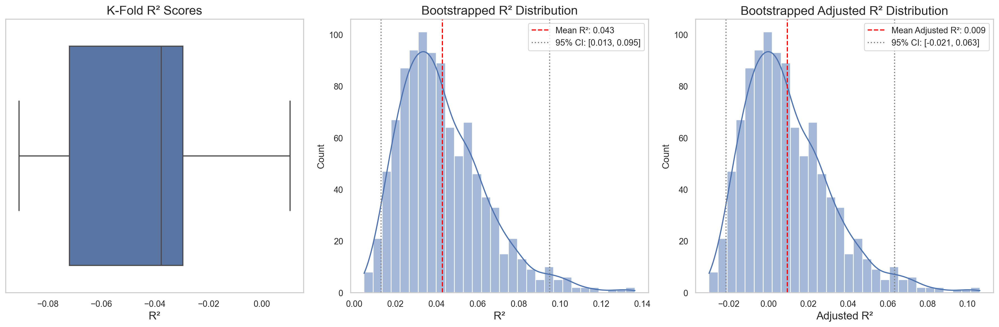


Mean Adjusted R-squared (Bootstrapped): 0.009
95% CI for Adjusted R-squared: [-0.02141041  0.06322198]


In [ ]:

for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    print(f"\n--- Plotting {stim_feature} ---\n")

    # Filter data for the current stimulus feature
    data = df_pink_filtered.dropna(subset=[stim_feature])
    
    y = data[stim_feature]
    
    # Plot the Results
    plot_ridge_results(y, ridge_results_dict[stim_feature], title=f"Ridge Regression for {stim_feature}")


#### Predicting log ISI from spike features, stimulus features, or both

##### Model 1: spike waveform features only

In [ ]:
# Define features (X) and target variable (y)
X_spike_only = df_pink_filtered.drop(columns=['log_isi', 'stim_exp', 'stim_mean', 'stim_std'])  # Drop log_isi and stimulus features
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_spike_only = run_ridge_regression_kfold(X_spike_only, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


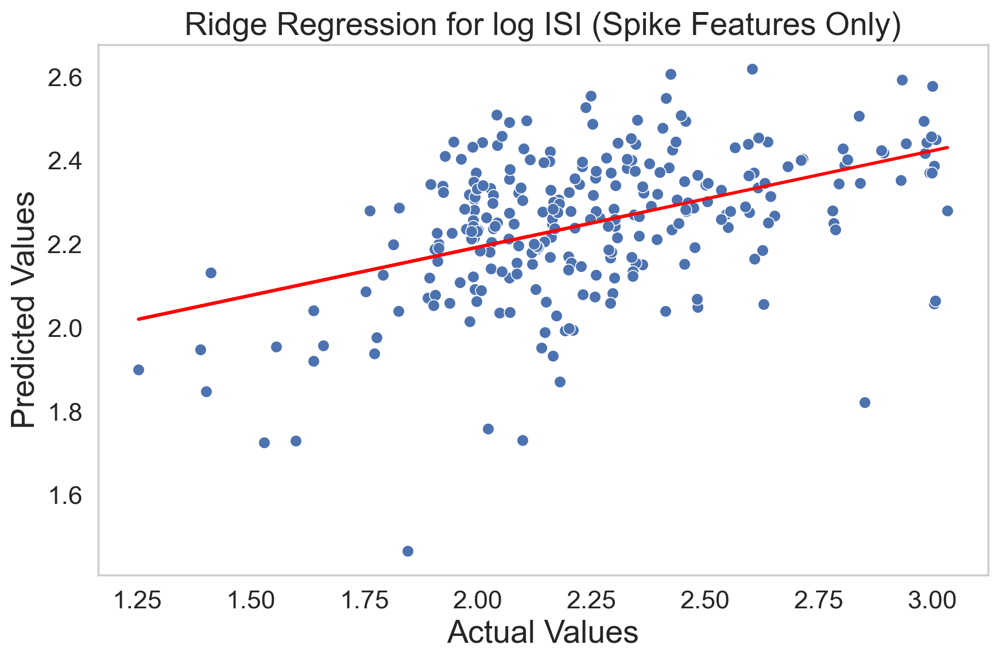

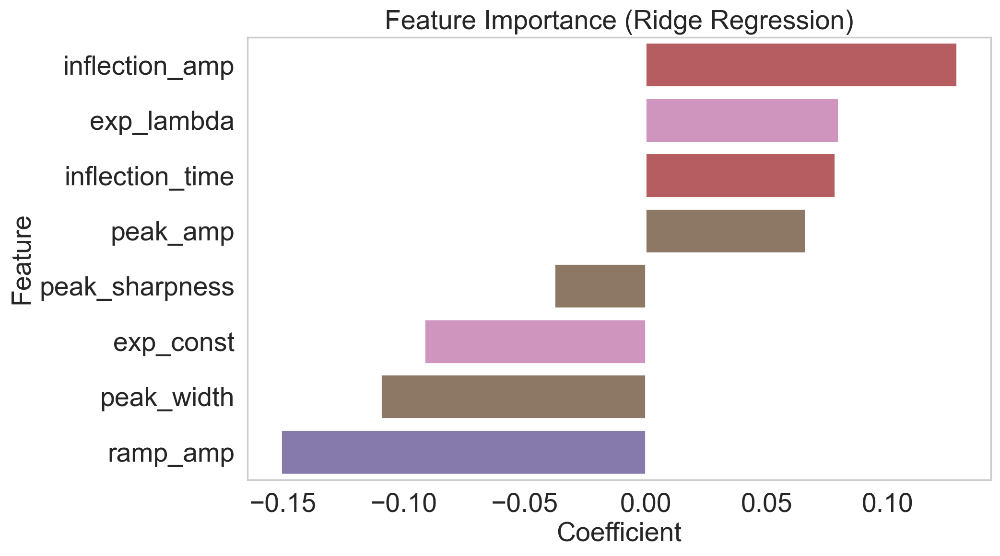


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
2   inflection_amp     0.128742  0.074068  0.180876   0.000000e+00
6       exp_lambda     0.079799 -0.079930  0.235645  1.494453e-150
1  inflection_time     0.078275 -0.047770  0.212591  1.440122e-184
3         peak_amp     0.065972  0.036594  0.103319   0.000000e+00
5   peak_sharpness    -0.037761 -0.345636  0.264740   1.036623e-16
7        exp_const    -0.091563 -0.119735 -0.061185   0.000000e+00
4       peak_width    -0.109596 -0.261122  0.046486  1.730032e-227
0         ramp_amp    -0.150823 -0.230776 -0.066765   0.000000e+00


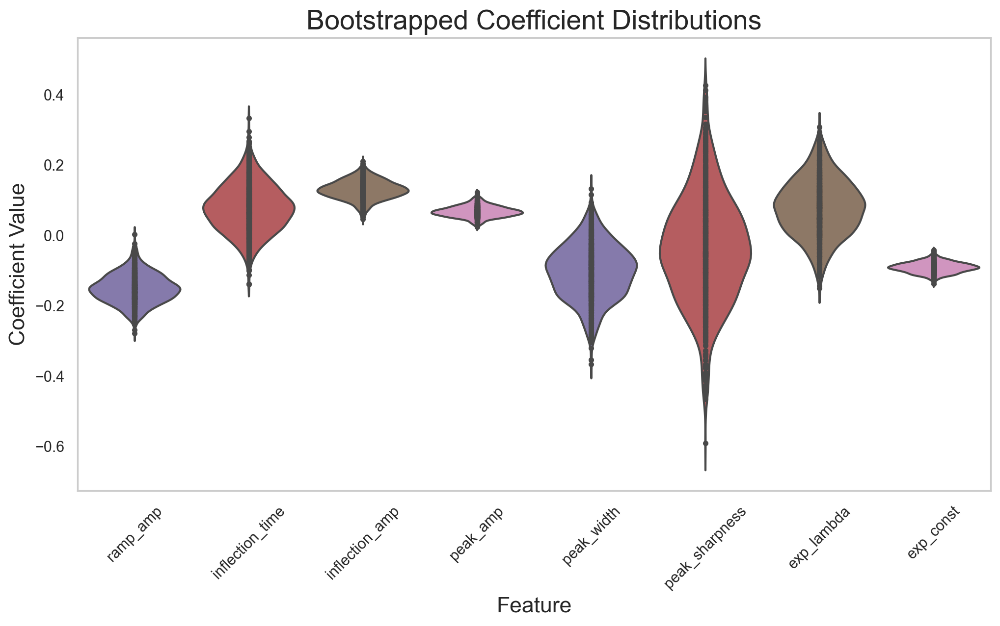

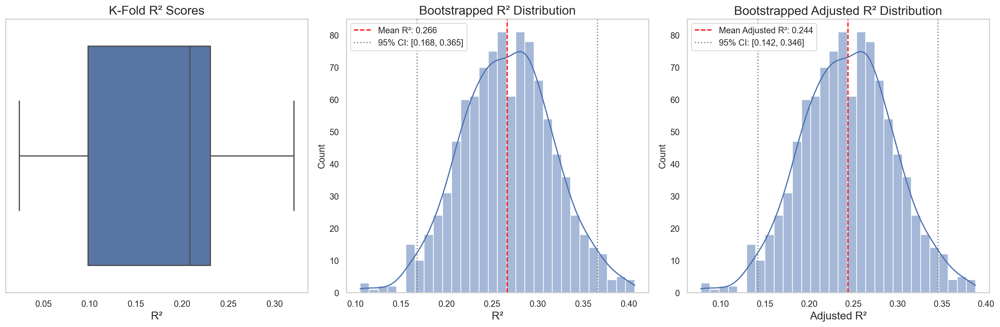


Mean Adjusted R-squared (Bootstrapped): 0.244
95% CI for Adjusted R-squared: [0.14204452 0.34569959]


In [ ]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_spike_only, title="Ridge Regression for log ISI (Spike Features Only)")

##### Model 2: spike waveform features + stimulus features

In [ ]:
# Define features (X) and target variable (y)
X_spike_stim = df_pink_filtered.drop(columns=['log_isi'])  # Drop only the target variable
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_spike_stim = run_ridge_regression_kfold(X_spike_stim, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


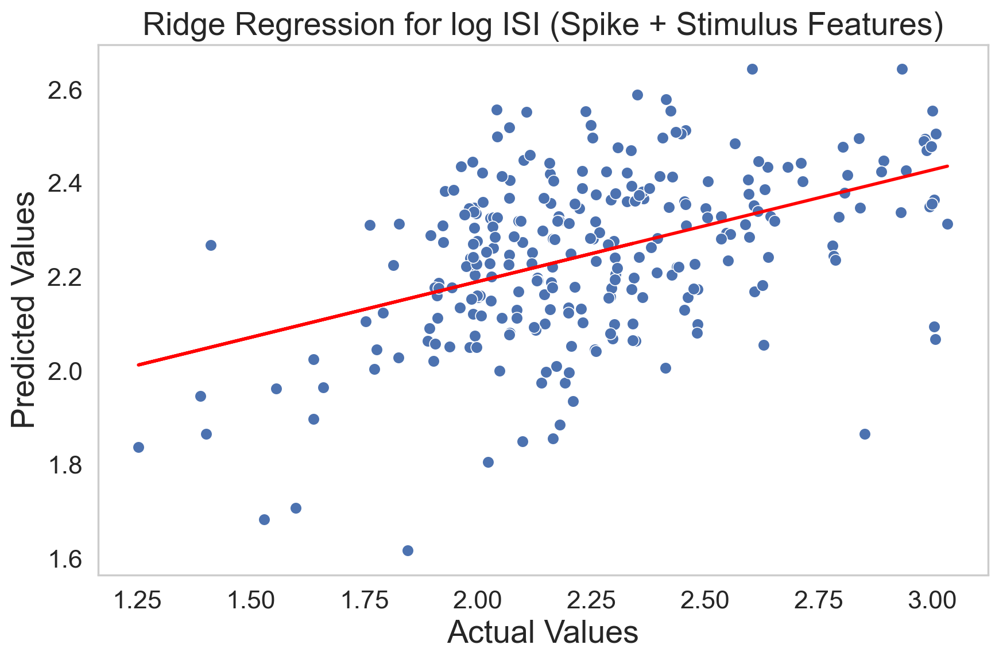

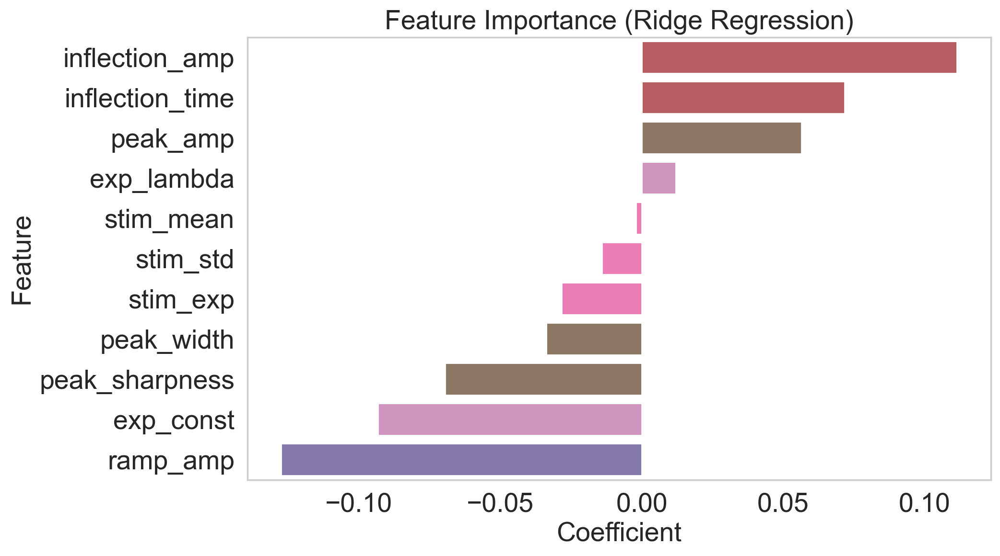


Significant Features (p < 0.05):
            Feature  Coefficient  CI Lower  CI Upper        p-value
5    inflection_amp     0.111367  0.053486  0.174135   0.000000e+00
4   inflection_time     0.071678 -0.056853  0.209993  3.556813e-166
6          peak_amp     0.056354  0.024019  0.093872   0.000000e+00
9        exp_lambda     0.011982 -0.138576  0.164167   1.534864e-06
1         stim_mean    -0.002089 -0.004353  0.000192  2.361035e-317
2          stim_std    -0.014025 -0.043643  0.010467  6.031558e-171
0          stim_exp    -0.028302 -0.175833  0.109635   3.883863e-36
7        peak_width    -0.033785 -0.175629  0.110044   8.087307e-43
8    peak_sharpness    -0.069530 -0.339297  0.211080   3.579575e-41
10        exp_const    -0.093308 -0.121092 -0.060067   0.000000e+00
3          ramp_amp    -0.127492 -0.214567 -0.048287   0.000000e+00


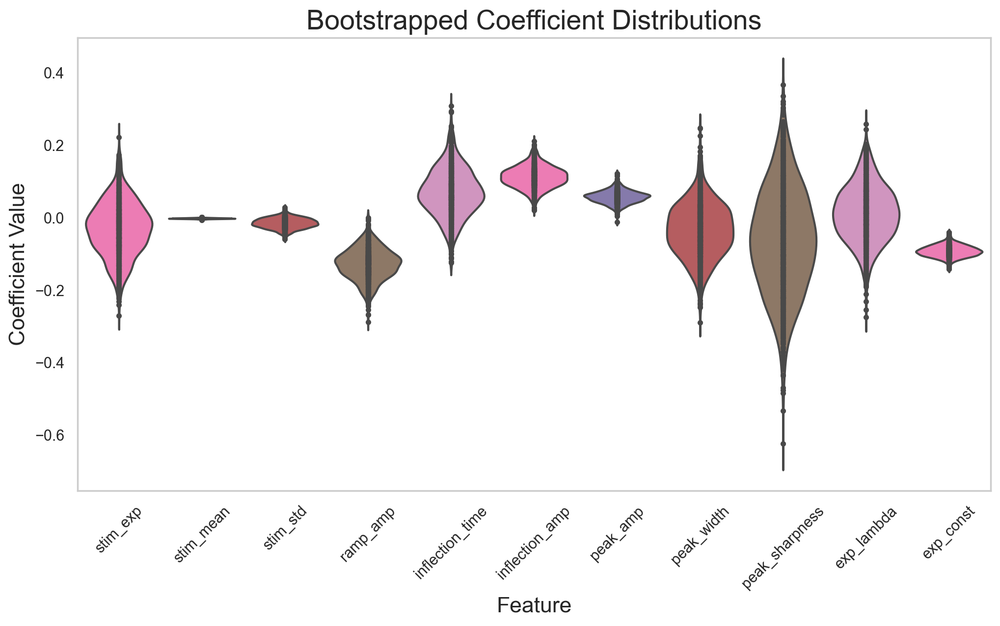

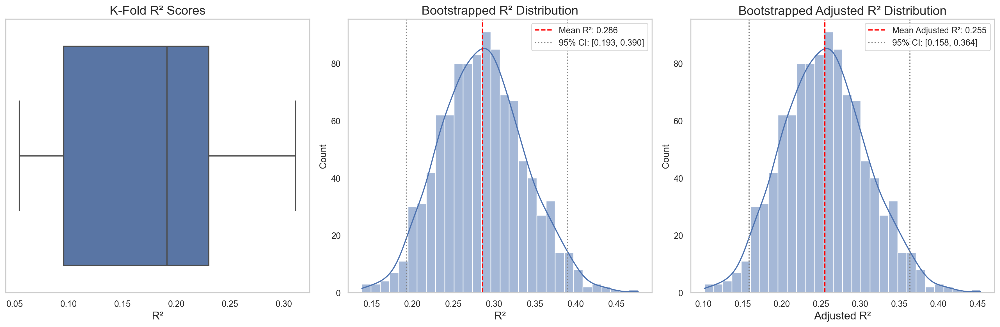


Mean Adjusted R-squared (Bootstrapped): 0.255
95% CI for Adjusted R-squared: [0.15797072 0.36358937]


In [ ]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_spike_stim, title="Ridge Regression for log ISI (Spike + Stimulus Features)")

##### Model 3: stimulus features only

In [ ]:
# Define features (X) and target variable (y)
X_stim_only = df_pink_filtered[['stim_exp', 'stim_mean', 'stim_std']]  # Use only stimulus features
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_stim_only = run_ridge_regression_kfold(X_stim_only, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


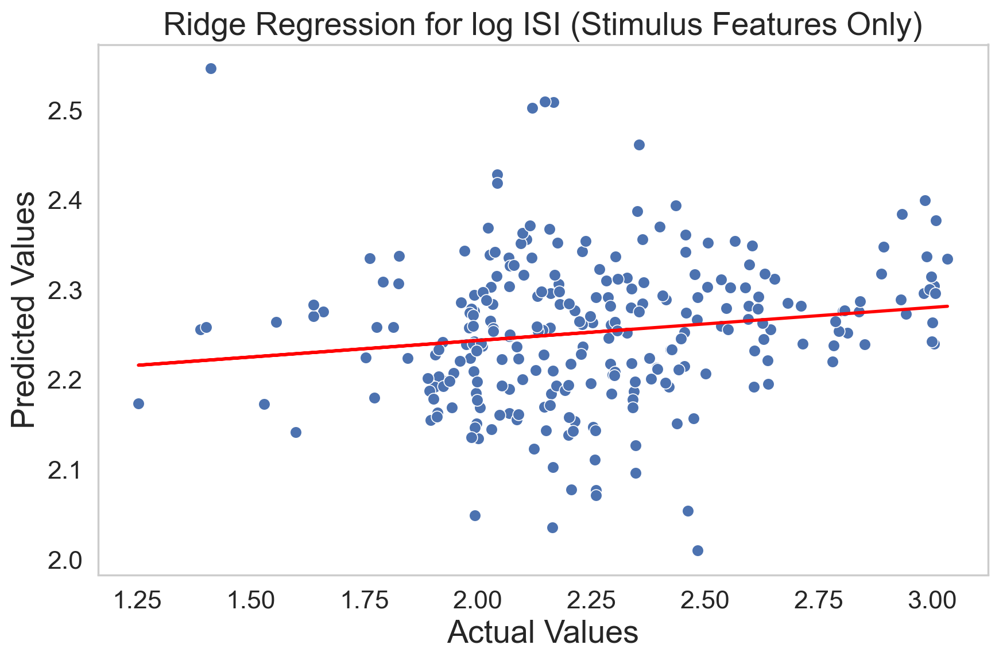

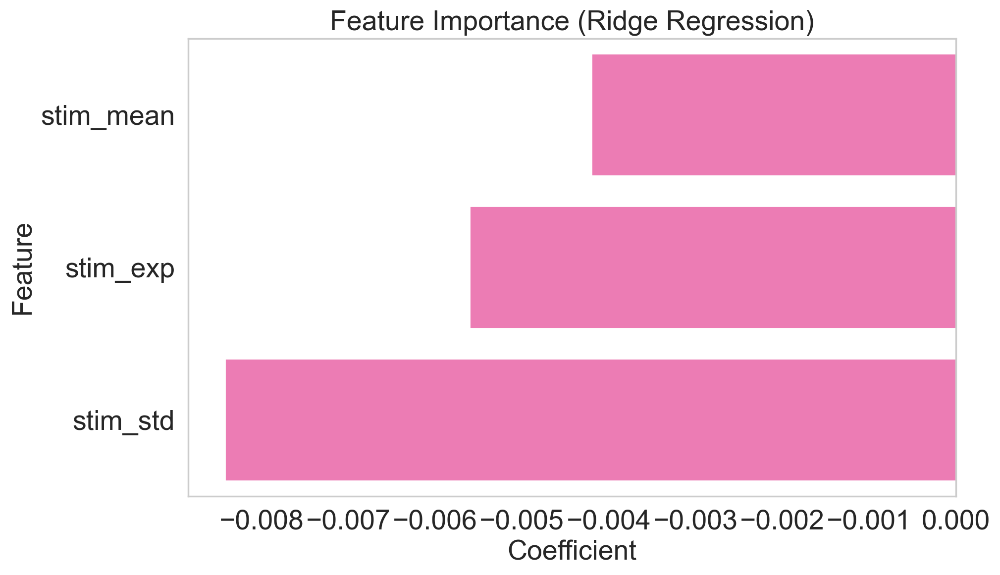


Significant Features (p < 0.05):
     Feature  Coefficient  CI Lower  CI Upper       p-value
1  stim_mean    -0.004201 -0.006675 -0.002071  0.000000e+00
0   stim_exp    -0.005602 -0.190843  0.182947  4.064338e-04
2   stim_std    -0.008424 -0.044735  0.021222  1.204026e-67


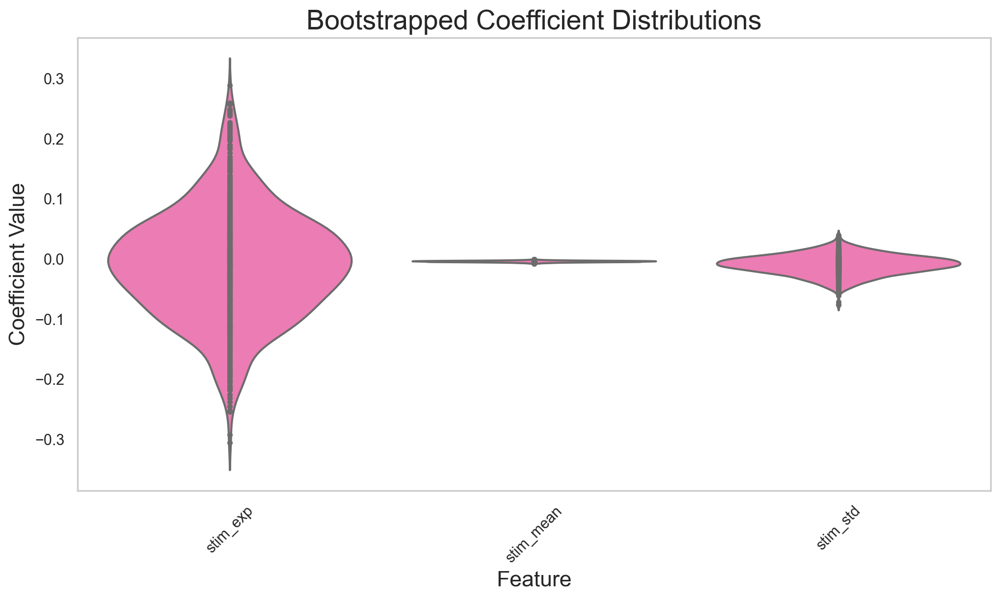

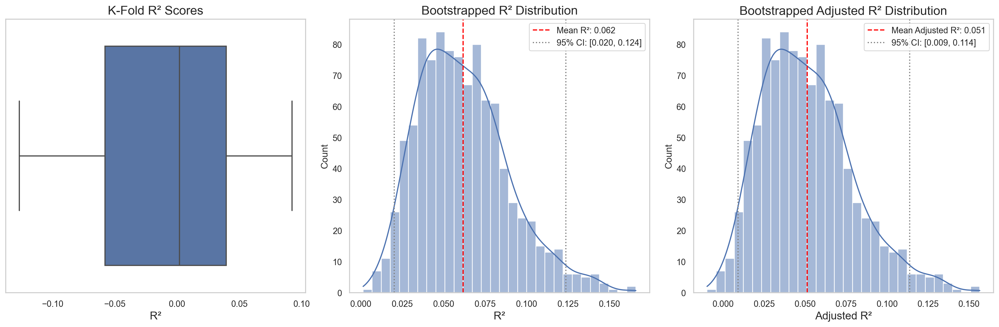


Mean Adjusted R-squared (Bootstrapped): 0.051
95% CI for Adjusted R-squared: [0.00907102 0.11373255]


In [ ]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_stim_only, title="Ridge Regression for log ISI (Stimulus Features Only)")

#### Model comparison: which feature set best predicts log ISI?

In [ ]:
#Set up dataframes for plotting 

feature_importance_spike_only_df = pd.DataFrame({'Feature': ridge_results_spike_only['feature_names'], 'Coefficient': ridge_results_spike_only['coefficients']})
feature_importance_spike_stim_df = pd.DataFrame({'Feature': ridge_results_spike_stim['feature_names'], 'Coefficient': ridge_results_spike_stim['coefficients']})
feature_importance_stim_only_df = pd.DataFrame({'Feature': ridge_results_stim_only['feature_names'], 'Coefficient': ridge_results_stim_only['coefficients']})

feature_importance_spike_only_df['Model'] = 'No stim features'
feature_importance_spike_stim_df['Model'] = 'With stim features'
feature_importance_stim_only_df['Model'] = 'Only stim features'

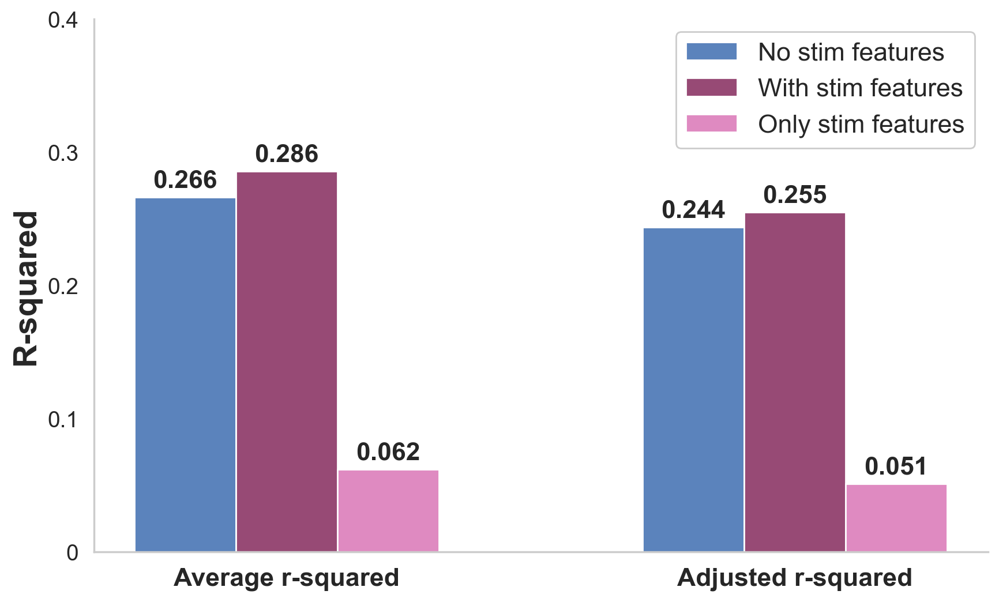

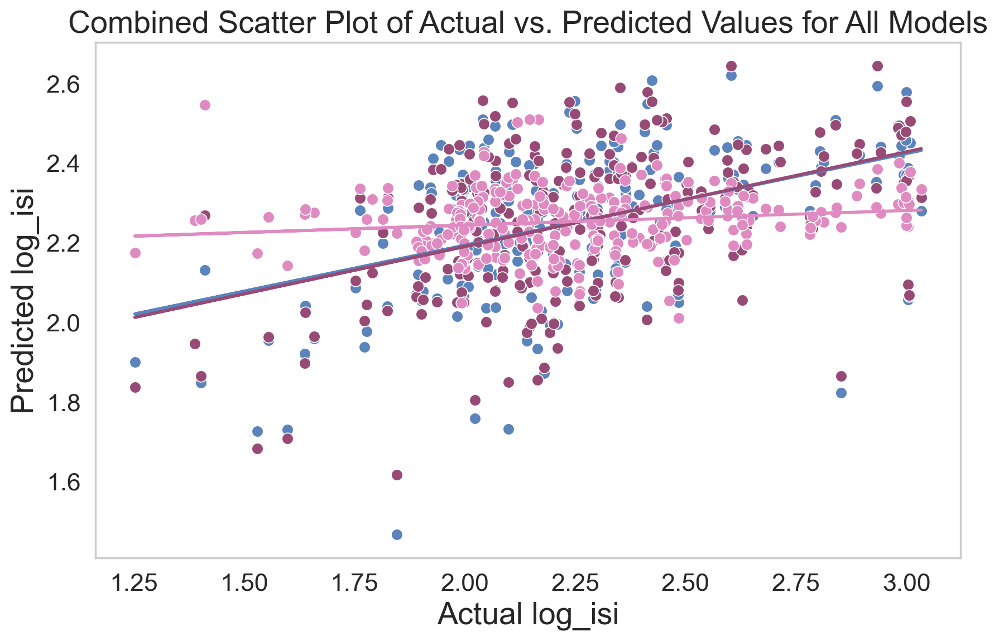

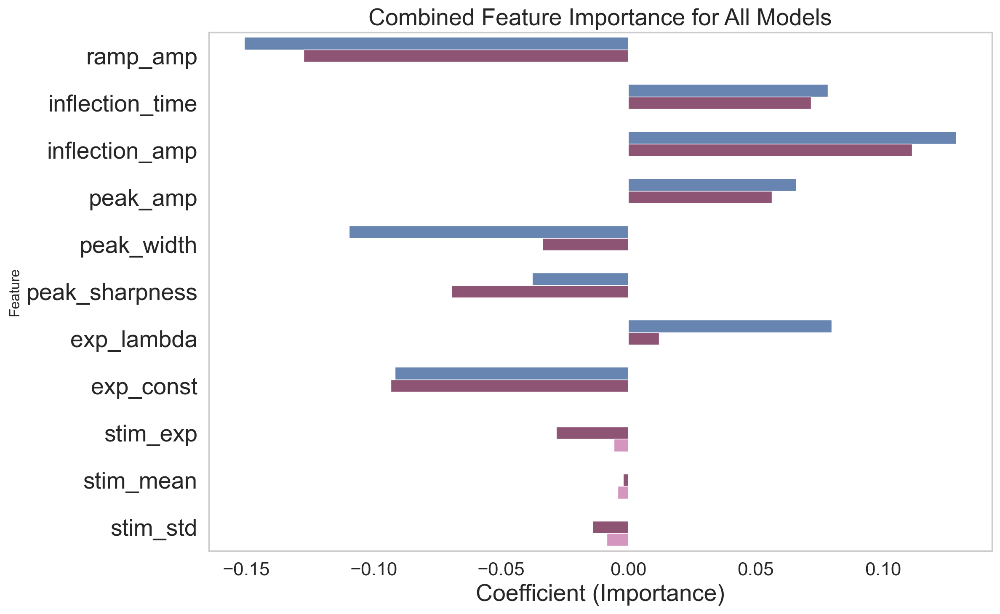

In [ ]:
#Plot comparisons
plot_r2_comparison(ridge_results_spike_only, ridge_results_spike_stim, ridge_results_stim_only)
plot_combined_actual_vs_predicted(y_log_isi, ridge_results_spike_only['y_pred_cv'], ridge_results_spike_stim['y_pred_cv'], ridge_results_stim_only['y_pred_cv'])
plot_combined_feature_importance(feature_importance_spike_only_df, feature_importance_spike_stim_df, feature_importance_stim_only_df)


#### When does the effect start? — stimulus onset analysis

The main analysis uses a fixed 5ms window before the inflection point for `stim_mean`. Here we slide that window from 0 to 100ms before the inflection and track how Pearson r between pre-spike stimulus amplitude and each waveform feature changes with lag.

In [ ]:
# df must retain sweep/spike_num for lag analysis — use df before the drop
df_pink_raw = df.loc[df['stim_type'] == 'pink']
valid_idx_raw = [i for i in last_spikes_indices if i in df_pink_raw.index]
df_pink_raw_filtered = df_pink_raw.drop(valid_idx_raw)

lag_centers, r_vals, p_vals, feat_names = compute_stim_lag_correlations(
    f, fs, df_pink_raw_filtered, one_ms,
    window_ms=5, max_lag_ms=100,
)
plot_stim_lag_correlations(lag_centers, r_vals, p_vals, feat_names, title='Cell 2')